In [1]:
# Initialize Notebook
from IPython.core.display import HTML,Image
#%run ../library/v1.0.5/init.ipy
HTML('''<script> code_show=true;  function code_toggle() {  if (code_show){  $('div.input').hide();  } else {  $('div.input').show();  }  code_show = !code_show }  $( document ).ready(code_toggle); </script> <form action="javascript:code_toggle()"><input type="submit" value="Toggle Code"></form>''')

In [1]:
import gc, argparse, sys, os, errno
from IPython.core.display import HTML,Image
from functools import reduce
import h5py
%pylab inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm_notebook as tqdm
import scipy
import sklearn
from scipy.stats import pearsonr
import warnings
warnings.filterwarnings('ignore')
from bokeh.io import output_notebook, show
output_notebook()
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap
from sklearn.metrics import roc_curve,roc_auc_score,auc
from sklearn.preprocessing import RobustScaler,MinMaxScaler,StandardScaler
from sklearn.neighbors import NearestNeighbors
from bokeh.palettes import Category20c
from ipywidgets import interact,interactive, FloatSlider,IntSlider, RadioButtons,Dropdown,Tab,Text

Populating the interactive namespace from numpy and matplotlib


Loading BokehJS ...

In [2]:
def embed_pdf_figure(width='640', height='480', title='Image'):
    data = BytesIO()
    plt.savefig(data, format='pdf', metadata={'Title': title})
    data = data.getvalue()
    data = 'data:application/pdf;base64,'+ str(b64encode(data), encoding='utf-8')
    display(HTML('<object width="{}" height="{}" data="{}" download="{}.pdf"></object>'.format(
        width, height, data, title)))
    plt.close()
    

from matplotlib.backends.backend_pdf import PdfPages, PdfFile
from IPython.display import HTML, display, FileLink
from base64 import b64encode, b64decode
from io import StringIO, BytesIO
from contextlib import contextmanager

@contextmanager
def embed_pdf_pages(width=960, height=480, title='Image'):
    data = BytesIO()
    try:
        pdf = PdfPages(data, metadata={'Title': title})
        yield pdf
    finally:
        pdf.close()
        data = data.getvalue()
        data = 'data:application/pdf;base64,'+ str(b64encode(data), encoding='utf-8')
        display(HTML('<object width="{}" height="{}" data="{}"></object>'.format(width, height, data)))
        plt.close()

@contextmanager
def embed_pdf_data(width=640, height=480, title='Image'):
    try:
        data = BytesIO()
        yield data
    finally:
        data = data.getvalue()

        data = 'data:application/pdf;base64,'+ str(b64encode(data), encoding='utf-8')
        display(HTML('<object width="{}" height="{}" data="{}"></object>'.format(width, height, data)))
        plt.close()

fonttitle = {'family':'Arial',
                  'weight' : 'normal', 
                  'size' : 8}
fontlabel = {'family':'Arial',
                  'weight' : 'normal', 
                  'size' : 6.5}
fontticklabel = {'family':'Arial',
                  'weight' : 'normal', 
                  'size' : 6.5}
fontlegend = {'family':'Arial',
                  'weight' : 'normal', 
              #'linewidth':0.5,
                  'size' : 6.5}
fontcbarlabel = {'family':'Arial',
                 'weight' : 'normal', 
                 #'Rotation' : 270,
                 #'labelpad' : 25,
                 'size' : 6.5}
fontcbarticklabel = {'family':'Arial',#Helvetica
                 'weight' : 'normal', 
                 'size' : 5.5}
def std_plot(ax,xlabel,ylabel,title=None,
             legendtitle=None,bbox_to_anchor=None,
             labelspacing=1.2,borderpad=0,handletextpad=0,legendsort=True,markerscale=None,
             xlim=None,ylim=None,
             xbins=None,ybins=None,
             cbar=None,cbarlabel=None,
             moveyaxis=False,sns=False,left=True):
    #plt.yticks([0,0.2,0.4,0.6,0.8,1.0],['0','0.2','0.4','0.6','0.8','1.0'])
    pyplot.draw()
    #plt.figure(linewidth=30.5)
    if xlim is not None:  
        ax.set(xlim=xlim)
    if ylim is not None:
        ax.set(ylim=ylim)
    #pyplot.draw()
    if xbins is not None:
        locator = MaxNLocator(nbins=xbins)
        locator.set_axis(ax.xaxis)
        ax.set_xticks(locator())
    if ybins is not None:
        locator = MaxNLocator(nbins=ybins)
        locator.set_axis(ax.yaxis)
        ax.set_yticks(locator())
    pyplot.draw()
    ax.set_xticks(ax.get_xticks())
    ax.set_yticks(ax.get_yticks())
    ax.set_xlabel(xlabel,fontdict = fontlabel,labelpad=5.5)
    ax.set_ylabel(ylabel,fontdict = fontlabel,labelpad=5.5)
    ax.set_xticklabels(ax.get_xticklabels(),fontticklabel)
    ax.set_yticklabels(ax.get_yticklabels(),fontticklabel)

    if moveyaxis is True:
        #fontticklabel 
        ax.spines['left'].set_position(('data',0))
    ax.spines['left'].set_visible(left)
    ax.spines['right'].set_visible(not left)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_linewidth(0.5)
    ax.spines['bottom'].set_linewidth(0.5)
    ax.spines['left'].set_linewidth(0.5)
    ax.spines['bottom'].set_color('k')
    ax.spines['left'].set_color('k')
    ax.spines['right'].set_color('k')
    
    ax.tick_params(direction='out', pad=2)
    #ax.spines['bottom']._edgecolor="#000000"
    #ax.spines['left']._edgecolor="#000000"
    if title is not None:
        ax.set_title(title,fontdict = fonttitle)
    if legendtitle is not None:
        #if legendloc is None:
        #    legendloc="best"
        legend = ax.legend(title=legendtitle,prop=fontlegend,
                      bbox_to_anchor=bbox_to_anchor,
                      labelspacing=labelspacing,borderpad=borderpad,handletextpad=handletextpad,
                      edgecolor="#000000",fancybox=False,markerscale=markerscale)
        ax.legend_.get_frame()._linewidth=0.5
        legend.get_title().set_fontweight('normal')
        legend.get_title().set_fontsize(6.5)
        if legendsort is True:
            # h: handle l:label
            h,l = ax.get_legend_handles_labels()
            l,h = zip(*sorted(zip(l,h), key=lambda t: int(t[0]))) 
            legend = ax.legend(h,l,title=legendtitle,prop=fontlegend,
                      bbox_to_anchor=bbox_to_anchor,
                      labelspacing=labelspacing,borderpad=borderpad,handletextpad=handletextpad,
                      edgecolor="#000000",fancybox=False,markerscale=markerscale)
            ax.legend_.get_frame()._linewidth=0.5
            legend.get_title().set_fontweight('normal')
            legend.get_title().set_fontsize(6.5)
        if sns is True:
            h,l = ax.get_legend_handles_labels()
            #l,h = zip(*sorted(zip(l,h), key=lambda t: int(t[0]))) 
            legend = ax.legend(h[1:],l[1:],title=legendtitle,prop=fontlegend,
                      bbox_to_anchor=bbox_to_anchor,
                      labelspacing=labelspacing,borderpad=borderpad,handletextpad=handletextpad,
                      edgecolor="#000000",fancybox=False,markerscale=markerscale)
            ax.legend_.get_frame()._linewidth=0.5
            legend.get_title().set_fontweight('normal')
            legend.get_title().set_fontsize(6.5)

    if cbar is not None:
        #locator, formatter = cbar._get_ticker_locator_formatter()
        #ticks, ticklabels, offset_string = cbar._ticker(locator, formatter)
        #cbar.ax.spines['top'].set_visible(False)
        #cbar.ax.spines['right'].set_visible(False)
        #cbar.ax.spines['bottom'].set_visible(False)
        #cbar.ax.spines['left'].set_visible(False)
        cbar.ax.tick_params(direction='out', pad=3,width=0,length=0)
        cbar.set_label(cbarlabel,fontdict = fontcbarlabel,Rotation=270,labelpad=7.5)
        cbar.ax.set_yticks(cbar.ax.get_yticks())
        cbar.ax.set_yticklabels(cbar.ax.get_yticklabels(),fontcbarticklabel)
    return ax

def gradient_func(val):
    return '<span style="background: linear-gradient(90deg, #d65f5f {0}%, transparent 0%)">{0:.3f}</span>'.format(val)

def display_dataframe(df, filename=None, encoding='utf-8', format='csv', type='button',gradientfunc=False, **kwargs):
    #display(df)
    #if isinstance(df, pd.DataFrame):
    #    display(df.style.set_caption(filename))
    #else:
    if gradientfunc == False:
        display(df.style.set_caption(filename))    
    else:
        display(df.style.format(gradient_func).set_caption(filename)) 
    if filename is None:
        filename = "dataframe"
    if format == 'csv':
        data = df.to_csv(**kwargs)
        mime_type = 'text/csv'
        filename = filename + '.csv'
    elif format == 'tsv':
        data = df.to_csv(**kwargs)
        mime_type = 'text/plain'
        filename = filename + '.txt'
    else:
        raise ValueError('unknown file format: {}'.format(format))
    data = 'data:{mime_type};base64,'.format(mime_type=mime_type) + str(b64encode(bytes(data, encoding=encoding)), encoding=encoding)
    if type == 'hyperlink':
        display(HTML('<a href=" " download={filename} target="_blank">{filename}</a >'.format(
            mime_type=mime_type, filename=filename, data=data)))
    elif type == 'button':
        button_id = 'button_{}'.format(np.random.randint(1000000000))
        display(HTML(r'<input type="button" id="{0}" value="Download">'.format(button_id)))
        display(HTML('''<script>
    document.getElementById("{button_id}").addEventListener("click", function(event){{
        var filename = "{filename}";
        var data = "{data}";
        const element = document.createElement('a');
        element.setAttribute('href', data);
        element.setAttribute('download', filename);
        element.style.display = 'none';
        document.body.appendChild(element);
        element.click();
        document.body.removeChild(element);
    }});
</script>'''.format(button_id=button_id, filename=filename, data=data)))

In [4]:
cd ~/ex

/home/xieyufeng/ex


In [5]:
def interactive_config_settings(dataset,sequencing_type,classifier,value_change,example_cancer,reads_preprocess,stage_info):
    if sequencing_type == 'short':
        exp_mx_name = 'domains_combined'
    elif sequencing_type =='long':
        exp_mx_name = 'featurecounts'
    elif sequencing_type =='domain_only':
        exp_mx_name = 'domains_long'
    elif sequencing_type =='transcript':
        exp_mx_name = 'transcript'
    elif sequencing_type =='transcript_small':
        exp_mx_name = 'transcript_small'
    elif sequencing_type =='transcript_long_bg':
        exp_mx_name = 'transcript_long_bg'
    return dataset,sequencing_type,classifier,value_change,exp_mx_name,example_cancer,reads_preprocess,stage_info

widget =interactive(interactive_config_settings,
           dataset= ['scirep','exorbase','exosome_small','pico_3v3'],
           sequencing_type=['short','long','domain_only','transcript','transcript_small','transcript_long_bg'],
           classifier = ['random_forest','logistic_regression','linear_svm','decision_tree','logistic_regression_l1'],
           value_change = ['any','up','down'],
        example_cancer=['Normal-CRC','Normal-PAAD','Normal-PRAD','Normal-HCC'],
                   reads_preprocess=[True,False],
                   stage_info = ['No Stage','With Stage'])  # if start from preprocessing
display(widget)


interactive(children=(Dropdown(description='dataset', options=('scirep', 'exorbase', 'exosome_small', 'pico_3v3'), value='scirep'), Dropdown(description='sequencing_type', options=('short', 'long', 'domain_only', 'transcript', 'transcript_small', 'transcript_long_bg'), value='short'), Dropdown(description='classifier', options=('random_forest', 'logistic_regression', 'linear_svm', 'decision_tree', 'logistic_regression_l1'), value='random_forest'), Dropdown(description='value_change', options=('any', 'up', 'down'), value='any'), Dropdown(description='example_cancer', options=('Normal-CRC', 'Normal-PAAD', 'Normal-PRAD', 'Normal-HCC'), value='Normal-CRC'), Dropdown(description='reads_preprocess', options=(True, False), value=True), Dropdown(description='stage_info', options=('No Stage', 'With Stage'), value='No Stage'), Output()), _dom_classes=('widget-interact',))

In [6]:
dataset,sequencing_type,classifier_use,value_change,exp_mx_name,example_cancer,reads_preprocess,stage_info = widget.result
dataset,sequencing_type,classifier_use,value_change,exp_mx_name,example_cancer,reads_preprocess,stage_info

('scirep',
 'short',
 'random_forest',
 'any',
 'domains_combined',
 'Normal-CRC',
 True,
 'No Stage')

In [7]:
file_counts = 'output/'+dataset+'/summary/read_counts.txt'
file_length_path = 'output/'+dataset+'/stats/mapped_read_length_by_sample/'
file_length_path_insert = 'output/'+dataset+'/stats/mapped_insert_size_by_sample/'
plot_save_path = 'output/'+dataset+'/plots/'

    
import datetime
now = datetime.datetime.now()
timenow = '{}.{}.{}.{}:{}'.format(now.year,now.month,now.day,now.hour,now.minute)
savepath = 'output/candidate/'+dataset+'/'+dataset+'.'+sequencing_type+'.'+classifier_use+'.'+value_change+'.'+timenow+'/'
save_path = 'output/candidate/'+dataset+'/'+dataset+'.'+sequencing_type+'.'+classifier_use+'.'+value_change+'.'+timenow+'/'

if not os.path.exists(savepath):
    os.mkdir(savepath)

In [8]:
def log_transfrom(data,small=0.01):
    return np.log2(data+small)

# Basic plot

In [138]:
#Get table
def get_counts_ratio_table(file_counts,sequencing_type='short'):
    df = pd.read_table(file_counts, index_col=0)
    if reads_preprocess == True:
        if sequencing_type == 'short':
            rna_types = [s.split('.')[0] for s in df.index.tolist() if s.endswith('.mapped')]
            rna_types = 'rRNA,miRNA,piRNA,Y_RNA,srpRNA,tRNA,snRNA,snoRNA,lncRNA,mRNA,tucpRNA,intron,promoter,enhancer,repeats,circRNA,other'.split(',')
            mapped_ratio = {}
            mapped_count = {}
            for sample_id in df.columns.tolist():
                mapped_ratio[sample_id] = {}
                mapped_count[sample_id] = {}
                clean_counts = float(df.loc['clean.unmapped', sample_id])
                for rna_type in rna_types:
                    mapped_ratio[sample_id][rna_type] = df.loc[rna_type + '.mapped', sample_id]/(
                        clean_counts - df.loc['other.unmapped', sample_id])
                    mapped_count[sample_id][rna_type] = df.loc[rna_type + '.mapped', sample_id]
                for region in ('promoter', 'enhancer', 'intron','repeats','circRNA'):
                    mapped_ratio[sample_id]['other'] -= mapped_ratio[sample_id][region]
                    mapped_count[sample_id]['other'] -= mapped_count[sample_id][region]
            mapped_count = pd.DataFrame.from_records(mapped_count)        
            mapped_ratio = pd.DataFrame.from_records(mapped_ratio)
            mapped_count = mapped_count.loc[rna_types, :]
            mapped_ratio = mapped_ratio.loc[rna_types, :]
            return df,mapped_count.T, mapped_ratio.T
        elif sequencing_type =='long':
            read_counts = pd.read_table(file_counts, index_col=0)
            read_counts = read_counts.T

            rna_types = read_counts.columns.tolist()
            rna_types.remove('clean')
            rna_types_included = list(rna_types)
            for rna_type in ('genome', 'rRNA'):
                rna_types_included.remove(rna_type)

            # percentage by clean reads
            #display(read_counts.style.set_caption('Read counts'))

            percent_by_clean = read_counts.loc[:, ['clean', 'rRNA', 'genome', 'circRNA']].copy()
            percent_by_clean = 100.0*percent_by_clean.div(percent_by_clean.loc[:, 'clean'], axis=0)
            percent_by_clean.drop(columns='clean', inplace=True)
            percent_by_clean['unmapped'] = 100 - percent_by_clean.sum(axis=1)
            #display(percent_by_clean.style.format(gradient_func).set_caption('Percentage by clean reads'))

            percent_by_mapped = read_counts.copy()
            percent_by_mapped = 100.0*percent_by_mapped.div(percent_by_mapped.loc[:, ['genome', 'circRNA']].sum(axis=1), axis=0)
            percent_by_mapped.drop(columns=['rRNA', 'genome', 'clean'], inplace=True)
            percent_by_mapped['other'] = 100.0 - percent_by_mapped.sum(axis=1)
            #display(percent_by_mapped.style.format(gradient_func).set_caption('Percentage by mapped reads'))
            return read_counts,percent_by_clean,percent_by_mapped
    else:
        if sequencing_type == 'short':
            pass
        elif sequencing_type =='long':
            read_counts = pd.read_table(file_counts, index_col=0)
            read_counts = read_counts.T

            rna_types = read_counts.columns.tolist()
            rna_types.remove('clean')
            rna_types_included = list(rna_types)
            for rna_type in ('genome', 'rRNA'):
                rna_types_included.remove(rna_type)

            # percentage by clean reads
            #display(read_counts.style.set_caption('Read counts'))

            percent_by_clean = read_counts.loc[:, ['clean', 'rRNA', 'genome', 'circRNA']].copy()
            percent_by_clean = 100.0*percent_by_clean.div(percent_by_clean.loc[:, 'clean'], axis=0)
            percent_by_clean.drop(columns='clean', inplace=True)
            percent_by_clean['unmapped'] = 100 - percent_by_clean.sum(axis=1)
            #display(percent_by_clean.style.format(gradient_func).set_caption('Percentage by clean reads'))

            percent_by_mapped = read_counts.copy()
            percent_by_mapped = 100.0*percent_by_mapped.div(percent_by_mapped.loc[:, ['genome', 'circRNA']].sum(axis=1), axis=0)
            percent_by_mapped.drop(columns=['rRNA', 'genome', 'clean'], inplace=True)
            percent_by_mapped['other'] = 100.0 - percent_by_mapped.sum(axis=1)
            #display(percent_by_mapped.style.format(gradient_func).set_caption('Percentage by mapped reads'))
            return read_counts,percent_by_clean,percent_by_mapped
        

In [139]:
def get_length_table(file_length_path,sequencing_type='short'):
    length_table = {}
    for i in os.listdir(file_length_path):
        if sequencing_type =='short':
            length_table[i] = pd.read_table(file_length_path+i,index_col=0).iloc[16:52]
        elif sequencing_type =='long':
            length_table[i] = pd.read_table(file_length_path+i,index_col=0).iloc[16:152]
    sample_names = np.array(os.listdir(file_length_path))
    length_table_sum = length_table[sample_names[0]]
    for i in sample_names[1:]:
        length_table_sum += length_table[i]
    return length_table_sum/length_table_sum.sum(axis=0)

In [140]:
if reads_preprocess == True:
    if sequencing_type == 'short': 
        read_counts,table_count, table_ratio = get_counts_ratio_table(file_counts)
        length_table = get_length_table(file_length_path,sequencing_type=sequencing_type)
        rnanames=np.array(table_ratio.columns).astype('str')
    elif sequencing_type == 'long': 
        read_counts,table_count_1, table_ratio_1,table_count_2, table_ratio_2 = \
                        get_counts_ratio_table(file_counts,sequencing_type='long')
        rnanames_1=np.array(table_ratio_1.columns).astype('str')
        rnanames_2=np.array(table_ratio_2.columns).astype('str')
        length_table_1 = get_length_table(file_length_path,sequencing_type=sequencing_type)
        length_table_2 = get_length_table(file_length_path_insert,sequencing_type=sequencing_type)
else:
    if sequencing_type == 'short': 
        pass
    elif sequencing_type == 'long': 
        read_counts,percent_by_clean,percent_by_mapped = \
                        get_counts_ratio_table(file_counts,sequencing_type='long')
        rnanames_1=np.array(percent_by_clean.columns).astype('str')
        rnanames_2=np.array(percent_by_mapped.columns).astype('str')
        length_table_1 = get_length_table(file_length_path,sequencing_type=sequencing_type)
        length_table_2 = get_length_table(file_length_path_insert,sequencing_type=sequencing_type)

In [141]:
if sequencing_type == 'short': 
    table_percent = table_ratio*100
    display_dataframe(table_count,filename='Mapped counts',gradientfunc=False)
    display_dataframe(table_percent,filename='Percentage by clean reads',gradientfunc=True)
elif sequencing_type == 'long': 
    display_dataframe(read_counts,filename='Read counts',gradientfunc=False)
    display_dataframe(percent_by_clean,filename='Percentage by clean reads',gradientfunc=True)
    display_dataframe(percent_by_mapped,filename='Percentage by mapped reads',gradientfunc=True)

,rRNA,miRNA,piRNA,Y_RNA,srpRNA,tRNA,snRNA,snoRNA,lncRNA,mRNA,tucpRNA,intron,promoter,enhancer,repeats,circRNA,other
Sample_1S1,2710145,2367858,2231703,159856,10063,1192989,72924,3161,50810,43985,15358,14683,18811,94482,131789,106,123532
Sample_1S10,1629968,2451143,2103127,88542,6048,931195,30802,2062,44639,40118,15321,13011,17792,97522,119503,90,148167
Sample_1S11,2272879,2824300,2436573,127084,8580,966880,45675,2884,60928,56902,21435,18018,24105,131103,151540,149,212277
Sample_1S12,3030702,2979583,2456711,144582,12183,1070268,59131,4395,53842,44830,13799,13926,21054,96823,138275,106,80860
Sample_1S13,1778928,2501530,2760974,89736,6507,1790410,43011,2848,42612,29171,10634,11857,12715,64569,99143,64,76453
Sample_1S14,2197443,1946642,3302499,105208,8307,1870826,48432,11469,47500,29478,10894,12070,13735,69761,116931,85,76892
Sample_1S15,1517066,1509001,2653245,87267,5619,1548449,29950,2063,38637,25290,10008,10798,11706,61580,96194,75,73083
Sample_1S16,1919819,2473806,2690755,120872,6775,1429103,39193,2814,44822,34236,12671,12423,14650,77495,114293,82,96340
Sample_1S17,3053709,2529547,3287205,143721,10873,1613219,60127,3880,56579,41107,13741,15784,18812,101591,150893,138,97079
Sample_1S18,1888862,1687399,2106196,99025,6954,1074847,40128,2761,51276,42820,15698,14413,18072,91231,117204,118,129377


,rRNA,miRNA,piRNA,Y_RNA,srpRNA,tRNA,snRNA,snoRNA,lncRNA,mRNA,tucpRNA,intron,promoter,enhancer,repeats,circRNA,other
Sample_1S1,29.323,25.620,24.147,1.730,0.109,12.908,0.789,0.034,0.550,0.476,0.166,0.159,0.204,1.022,1.426,0.001,1.337
Sample_1S10,21.062,31.672,27.176,1.144,0.078,12.032,0.398,0.027,0.577,0.518,0.198,0.168,0.230,1.260,1.544,0.001,1.915
Sample_1S11,24.279,30.170,26.028,1.358,0.092,10.328,0.488,0.031,0.651,0.608,0.229,0.192,0.257,1.400,1.619,0.002,2.268
Sample_1S12,29.652,29.151,24.036,1.415,0.119,10.471,0.579,0.043,0.527,0.439,0.135,0.136,0.206,0.947,1.353,0.001,0.791
Sample_1S13,19.085,26.837,29.620,0.963,0.070,19.208,0.461,0.031,0.457,0.313,0.114,0.127,0.136,0.693,1.064,0.001,0.820
Sample_1S14,22.268,19.726,33.466,1.066,0.084,18.958,0.491,0.116,0.481,0.299,0.110,0.122,0.139,0.707,1.185,0.001,0.779
Sample_1S15,19.753,19.648,34.547,1.136,0.073,20.162,0.390,0.027,0.503,0.329,0.130,0.141,0.152,0.802,1.253,0.001,0.952
Sample_1S16,21.120,27.214,29.601,1.330,0.075,15.721,0.431,0.031,0.493,0.377,0.139,0.137,0.161,0.853,1.257,0.001,1.060
Sample_1S17,27.270,22.589,29.355,1.283,0.097,14.406,0.537,0.035,0.505,0.367,0.123,0.141,0.168,0.907,1.347,0.001,0.867
Sample_1S18,25.572,22.845,28.515,1.341,0.094,14.552,0.543,0.037,0.694,0.580,0.213,0.195,0.245,1.235,1.587,0.002,1.752


## pie plot of RNA ratio

In [142]:
def plot_pie(data, rnanames):
    '''
    data: table_ratio
    rnanames: rna type names
    adjustment: merge RNA with small percent together
    '''
    from bokeh.io import output_file, show
    from bokeh.palettes import Category20
    from bokeh.plotting import figure
    from bokeh.transform import cumsum
    x = np.array(rnanames)
    y = np.array(data.loc[:,x].mean())+10e-8
    z_ = np.array([x[i] + str(' {:.2f}'.format(y[i]*100)+'%') for i in range(y.shape[0])])
    z = np.array([float('{:.10f}'.format(y[i]*100)) for i in range(y.shape[0])])
    labels = rnanames
    dataframe = pd.DataFrame(np.concatenate((x.reshape(-1,1),z.reshape(-1,1),z_.reshape(-1,1)),axis=1))
    dataframe.columns=['rna','percent','label']
    dataframe["percent"] = pd.to_numeric(dataframe["percent"])
    dataframe['angle'] = dataframe['percent']/dataframe['percent'].sum() * 2*pi
    dataframe['color'] = Category20[len(x)]
    p = figure(plot_height=500,width=750, title="Pie Chart", toolbar_location=None,
               tools="hover", tooltips="@label", x_range=(-0.5, 1.0))
    p.wedge(x=0.14, y=1, radius=0.45,
            start_angle=cumsum('angle', include_zero=True), end_angle=cumsum('angle'),
            line_color="black", fill_color='color', legend="label", source=dataframe)
    p.axis.axis_label=None
    p.axis.visible=False
    p.grid.grid_line_color = None
    show(p)
def plot_for_pie(sequencing_type=sequencing_type,by_sample=False):
    if by_sample:
        if sequencing_type == 'short': 
            for i in range(table_ratio.shape[0]):
                plot_pie(pd.DataFrame(table_ratio.iloc[i]).T, rnanames)
        elif sequencing_type == 'long': 
            for i in range(percent_by_mapped.shape[0]):
                plot_pie(pd.DataFrame(percent_by_mapped.iloc[i]/100.).T, rnanames_2)
    else:
        if sequencing_type == 'short': 
            plot_pie(table_ratio, rnanames)
        elif sequencing_type == 'long': 
            plot_pie(percent_by_mapped/100. , rnanames_2)
            
plot_for_pie(sequencing_type=sequencing_type,by_sample=False)

## boxplot of rna ratio

In [143]:
def plot_ratio_boxplot(data, rnanames, points_show = True, width=20, height=10, savefig=False):
    '''
    data: table_ratio
    rnanames: rna type names
    points_show: plot scatter points too
    '''
    fig, ax = plt.subplots(figsize=(width, height))
    sns.boxplot(data = data,ax=ax,boxprops=dict(alpha=.001),color='gray',width=0.65,saturation=0.01)
    if points_show:
        sns.stripplot(data = data,ax=ax,size=2, edgecolor='black')
    
    ax.set_xticklabels(rnanames,rotation=90)
    std_plot(ax,'type','percentage',ylim=[0,np.ceil(np.max(np.max(data))*10)/10])
    #ax.set_yticklabels(['{:.1f}%'.format((i-1)*10) for i in range(10)],fontsize=20,fontweight='bold')
    fig.tight_layout()
    if savefig:
        fig.savefig(save_path+'rna_ratio_box_plot.png', bbox_inches='tight')
    #plt.figure(linewidth=30.5)
    #ax.spines['right'].set_visible(False)
    #ax.spines['top'].set_visible(False)

if sequencing_type == 'long': 
    plot_ratio_boxplot(percent_by_mapped/100, rnanames_2, points_show = True, 
               width=7, height=5, savefig=1)
else: 
    plot_ratio_boxplot(table_ratio, rnanames, points_show = True, width=7, height=5, savefig=1)
embed_pdf_figure()

## line plot of rna length

In [144]:
def plot_length_line(data, rnanames, width=7, height=20, savefig=False):
    '''
    data: length_table
    rnanames: rna type names
    '''
    data=data.fillna(0)
    length = np.array(data.T)
    fig,ax=plt.subplots(length.shape[0],1,figsize=(width, height))
    for i in range(length.shape[0]):
        ax[i].plot(length[i],label=data.columns[i], color=Category20c[20][i],linewidth=1)
        ax[i].legend(loc='upper right')
        ax[i].set_xticks(np.arange(0, data.shape[0],5))
        ax[i].set_xticklabels(np.arange(data.index[0], data.index[-1]+5,5))
        std_plot(ax[i],'','',ylim=[0,max(length[i])],ybins=5)
        legend = ax[i].legend(prop=fontlegend,
              bbox_to_anchor=None,
              borderpad=1,
              edgecolor="#000000",fancybox=False)
        ax[i].legend_.get_frame()._linewidth=0.5
        legend.get_title().set_fontweight('normal')
        legend.get_title().set_fontsize(6.5)
        #ax[i].set(ylim=[0,1])
        #if i != 10:
        #    ax[i].spines['bottom'].set_visible(False)
        #    ax[i].set_xticks([])
    if savefig:
        fig.savefig(save_path+'rna_length_line_plot.eps', bbox_inches='tight')
    fig.tight_layout()
    embed_pdf_figure()

In [145]:
if sequencing_type == 'long': 
    plot_length_line(length_table_1, rnanames_1, width=7, height=length_table_1.shape[1], savefig=1)
    plot_length_line(length_table_2, rnanames_2, width=7, height=length_table_2.shape[1], savefig=1)
else: 
    plot_length_line(length_table, rnanames, width=7, height=length_table.shape[1], savefig=1)

## 3D barplot of rna length

In [146]:
from mpl_toolkits.mplot3d import Axes3D
def plot_3d(data, width=7, height=5,  azim = 45, elev = 32,savefig=False):
    '''
    data: length_table
    '''
    #data = length_table
    data=data.fillna(0)
    fig = plt.figure(figsize=(width,height))
    ax1 = fig.gca(projection="3d")
    num = data.shape[1]
    count_ = data.shape[0]
    xpos = np.repeat(np.arange(1,count_+1),num).reshape(count_,-1).T.ravel()
    ypos = np.repeat(range(num),count_).ravel()
    num_elements = len(xpos)
    zpos = np.zeros(count_*num)
    dx = np.ones(count_*num)/5
    dy = np.ones(count_*num)/5
    dz = np.array(data.T).ravel()
    
    for i in range(num):
        ax1.bar3d(xpos[count_*i:count_*(i+1)], ypos[count_*i:count_*(i+1)], zpos[count_*i:count_*(i+1)],
                  dx[count_*i:count_*(i+1)], dy[count_*i:count_*(i+1)],dz[count_*i:count_*(i+1)], color=(np.array(Category20c[20]))[:num][i],alpha=0.9)
    plt.xticks(range(count_), [str(i+16) for i in range(count_)], size=6.5,color='red',weight='normal',family='Arial',rotation=-azim)
    ax1.set_yticks(range(num))
    ax1.set_yticklabels(data.columns, color='blue',weight='normal',family='Arial', size=6.5)
    fig.canvas.draw()
    ax1.set_zticks(ax1.get_zticks())
    ax1.set_zticklabels(ax1.get_zticklabels(),weight='normal',family='Arial', size=6.5)
    for color,tick in zip((Category20c[20])[:num],ax1.yaxis.get_major_ticks()):
        tick.label1.set_color(color)
    ax1.view_init(azim=azim,elev=elev)  
    ax1.xaxis.pane.fill = False
    ax1.yaxis.pane.fill = False
    ax1.zaxis.pane.fill = False
    ax1.xaxis.pane.set_edgecolor('w')
    ax1.yaxis.pane.set_edgecolor('w')
    ax1.zaxis.pane.set_edgecolor('w')
    fig.tight_layout()
    if savefig:
        fig.savefig(save_path+'rna_length_3D_barplot.png', bbox_inches='tight')

In [148]:
if sequencing_type == 'long': 
    plot_3d(length_table_1,width=7, height=5, savefig=1, azim = 45, elev = 32)
    embed_pdf_figure()
    plot_3d(length_table_2,width=7, height=5, savefig=1, azim = 45, elev = 32)
    embed_pdf_figure()
else:
    plot_3d(length_table,width=7, height=5, savefig=True, azim = 45, elev = 32)
    embed_pdf_figure()

## stack bar plot of rna counts and ratio

In [149]:
from matplotlib.colors import LinearSegmentedColormap
def stack_bar_ratio(table, ax,statistics = 'ratio',savefig=1):   
    
    table.plot(kind='bar', stacked=True,ax=ax,width=0.5,
                legend=True,colormap=matplotlib.colors.ListedColormap ( Category20c[20]))
    #ax.legend(bbox_to_anchor=(1,1),fontsize='large')#, loc="lower right",
    #ax.set_title('Stacked Bar plot',fontsize=40)
    if savefig:
        fig.savefig(save_path+statistics+'_stack_barplot.png', bbox_inches='tight')
    return ax

In [150]:
fig,ax=plt.subplots(figsize=(14,4))
if sequencing_type == 'long': 
    ax = stack_bar_ratio(percent_by_mapped/100.,ax=ax)
else:
    ax = stack_bar_ratio(table_ratio,ax=ax)

std_plot(ax,'sample','percentage',legendtitle='type',legendsort=False,ylim=[0,1],bbox_to_anchor=(1,1),borderpad=0.2)
fig.tight_layout()
embed_pdf_figure()

In [151]:
fig,ax=plt.subplots(figsize=(14,4))
    
if sequencing_type == 'long': 
    ax = stack_bar_ratio(read_counts,ax=ax)
else:
    ax = stack_bar_ratio(table_count,ax=ax)

std_plot(ax,'sample','counts(1e7)',legendtitle='type',legendsort=False,bbox_to_anchor=(1,1),borderpad=0.2)
fig.tight_layout()
embed_pdf_figure()

## bar plot of RNA by sample

In [152]:
def plot_bar_by_rna(fig,ax,table,rnaname,savefig=1, statistics = 'ratio',height = 4, width=20):
    '''
    table: ratio or count table, rows are rna type
    statistics: ratio or count
    '''
    table = table.T
    count = np.array(table[table.index ==rnaname]).ravel()
    #fig,ax=plt.subplots(1,figsize=(width,height))
    counttable =  pd.DataFrame(np.concatenate((np.arange(1,table.shape[1]+1).reshape(-1,1),
                count[np.argsort(-count)].reshape(-1,1)),axis=1),columns=['sample',statistics])
    
    sns.barplot(ax=ax,x='sample',y=statistics,data = counttable,color=Category20c[20][np.random.randint(0,20)],alpha=1)
    ax.set_xticks(np.arange(0,table.shape[1],5))
    ax.set_xticklabels(np.arange(0,table.shape[1],5))
    ax.set_title(statistics+' of '+rnaname,fontsize=15)
    if savefig:
        fig.savefig(save_path+'sample_'+rnaname+'_'+statistics+'_bar_plot.png', bbox_inches='tight')

In [153]:
def plot_bar_by_rna_total(table,datatype='ratio'):
    fignum= table.columns.shape[0]
    fig,ax=plt.subplots(fignum ,1,figsize=(7 , 24 ))
    for i in range(fignum):
        plot_bar_by_rna(fig,ax[i],table,table.columns[i],statistics = datatype)
        std_plot(ax[i],'sample','ratio',datatype+' of '+table.columns[i])
    fig.tight_layout()

In [154]:
if sequencing_type == 'long': 
    plot_bar_by_rna_total(percent_by_mapped/100.,datatype='ratio')
else: 
    plot_bar_by_rna_total(table_ratio,datatype='ratio')


embed_pdf_figure()

In [155]:
if sequencing_type == 'long': 
    plot_bar_by_rna_total(percent_by_mapped/100.,datatype='count')
else: 
    plot_bar_by_rna_total(table_ratio,datatype='count')


embed_pdf_figure()

## FastQC

In [156]:
summary = pd.read_table('output/'+dataset+'/summary/fastqc.txt', sep='\t')
qc_status = summary.iloc[:, 9:]
qc_status.fillna('NA')
qc_status = qc_status.astype('str')
sample_ids = summary.sample_id
sections = qc_status.columns.values
def style_func(val):
    status, row, col = val.split('|')
    row, col = int(row), int(col)
    color = {'pass': 'green', 'fail': 'red', 'warn': 'orange'}.get(status, 'gray')
    return '<a href="../output/'+dataset+'/fastqc/{sample_id}_fastqc.html#M{section}" style="color: {color}">{status}</a>'.format(
        sample_id=sample_ids[row], color=color, status=status, section=col + 1)

pd.DataFrame(qc_status.values \
             + '|' + np.arange(qc_status.shape[0]).astype('str')[:, np.newaxis] \
             + '|' + np.arange(qc_status.shape[1]).astype('str')[np.newaxis, :],
             index=qc_status.index, columns=qc_status.columns) \
    .style.format(style_func)

,Basic Statistics,Per base sequence quality,Per tile sequence quality,Per sequence quality scores,Per base sequence content,Per sequence GC content,Per base N content,Sequence Length Distribution,Sequence Duplication Levels,Overrepresented sequences,Adapter Content,Kmer Content
0,pass,pass,warn,pass,fail,fail,pass,pass,fail,fail,fail,nan
1,pass,pass,fail,pass,fail,fail,pass,pass,fail,fail,fail,nan
2,pass,pass,warn,pass,fail,fail,pass,pass,fail,fail,fail,nan
3,pass,pass,warn,pass,fail,fail,pass,pass,fail,fail,fail,fail
4,pass,pass,fail,pass,fail,fail,pass,pass,fail,fail,fail,nan
5,pass,pass,warn,pass,fail,fail,pass,pass,fail,fail,fail,nan
6,pass,pass,pass,pass,fail,fail,pass,pass,fail,fail,fail,fail
7,pass,pass,fail,pass,fail,fail,pass,pass,fail,fail,fail,nan
8,pass,pass,warn,pass,fail,fail,pass,pass,fail,fail,fail,nan
9,pass,pass,warn,pass,fail,fail,pass,pass,fail,fail,fail,nan


## Sample QC
use PCA and tSNE to visualize outliters

In [157]:
original_mx_file = 'output/'+dataset+'/count_matrix/'+exp_mx_name+'.txt'
original_mx = pd.read_table(original_mx_file,index_col=0)

In [158]:
def PCA_plot_basic(ax,data,sampleclass,method = 'PCA'):
    X = np.log2(data + 0.01).T
    X = StandardScaler().fit_transform(X)
    if method == 'PCA':
        transform = PCA()
    elif method == 'tSNE':
        transform = TSNE()
    elif method == 'UMAP':
        transform = umap.UMAP(n_neighbors=5,min_dist=0.3,metric='correlation')
    
    X_pca = transform.fit_transform(X)
    plot_table = pd.DataFrame(X_pca[:,:2])
    plot_table.columns = ['dimension_1','dimension_2']
    g = sns.scatterplot(ax=ax,data=plot_table,x="dimension_1", y="dimension_2",
                   s=50)
    return g
    #plt.figure(linewidth=30.5)
    #ax.spines['right'].set_visible(False)
    #ax.spines['top'].set_visible(False)
def sample_qc_visualize_outlier(original_mx,table_ratio,method='PCA'):
    fig, ax = plt.subplots(1,2,figsize=(7, 4))
    if method=='PCA':
        method_PCA = True
    elif method=='tSNE':
        method_PCA = False
    g = PCA_plot_basic(ax[0],original_mx, method_PCA)
    std_plot(g,'Dimension 1','Dimension 2','Original matrix')
    g = PCA_plot_basic(ax[1],table_ratio, method_PCA)
    std_plot(g,'Dimension 1','Dimension 2','Table ratio')
    embed_pdf_figure()

In [159]:
sample_qc_visualize_outlier(original_mx,table_ratio.T,method='tSNE')

## Differential Expression

In [ ]:
# fc, q value, rpkm


In [55]:
if dataset =='scirep':
    compare_group_list = ['Normal-CRC','Normal-PAAD','Normal-PRAD','Normal-CRC_S1','Normal-CRC_S2','Normal-CRC_S3','Normal-CRC_S4']
elif dataset =='exorbase':
    compare_group_list = ['Normal-HCC','Normal-CRC','Normal-PAAD']
elif dataset =='pico_3v3':
    compare_group_list = ['Normal-CRC']
def volcano_plot():
    for compare_group in compare_group_list:
        detable = pd.read_table('output/'+dataset+'/differential_expression/'+exp_mx_name+'/'+compare_group+'/deseq2.txt'
                                ,index_col=0)
        de_plot_mx = pd.DataFrame(data={'feature':[name.split('|')[0] for name in detable.index.values],
                                  'log2FoldChange':detable['log2FoldChange'].tolist(),
                                  'padj':detable['padj'].tolist()})
        de_plot_mx.set_index('feature',inplace=True)
        de_plot_mx['threshold'] = (abs(de_plot_mx['log2FoldChange'])>1) & (de_plot_mx['padj']<0.05)
        de_plot_mx['-log10(q values)'] = [-math.log10(qvalue) for qvalue in de_plot_mx['padj'].tolist()]
        #de_plot_mx.iloc[np.where(de_plot_mx['threshold']==True)]
        de_plot_mx['color'] = de_plot_mx['threshold']
        for i in np.where(de_plot_mx['threshold']==True):
            de_plot_mx['color'][i]='#DA706F'
        for i in np.where(de_plot_mx['threshold']==False):
            de_plot_mx['color'][i]='#5876B9'

        fig,ax=plt.subplots(figsize=(4,4))
        ax.scatter(de_plot_mx['log2FoldChange'], de_plot_mx['-log10(q values)'], c=de_plot_mx['color'],s=10,alpha=0.8,edgecolors='none')
        ax.vlines(-1,-1,10,linewidth=0.5)
        ax.vlines(1,-1,10,linewidth=0.5)
        ax.hlines(-math.log10(0.05),-4,4,linewidth=0.5)
        std_plot(ax,'log2FoldChange','-log10(q values)','volcano plot of '+compare_group,ylim=[-2,18])
        ax.tick_params(direction='out', pad=2)
        fig.tight_layout()
        fig.savefig(savepath+'volcano plot of '+compare_group+'.eps')
        embed_pdf_figure()
volcano_plot()

In [52]:
stage_info ='No Stage'

In [53]:
if dataset=='scirep':
    if stage_info =='No Stage':
        class_info = 'data/'+dataset+'/sample_classes.no_stage.txt'
    else:
        class_info = 'data/'+dataset+'/sample_classes.txt'
original_mx_file = 'output/'+dataset+'/count_matrix/'+exp_mx_name+'.txt'

original_mx = pd.read_table(original_mx_file,index_col=0)
sample_class = pd.read_table(class_info,sep='\t',index_col=0)

In [59]:
detable = pd.read_table('output/'+dataset+'/differential_expression/'+exp_mx_name+'/'+compare_group+'/deseq2.txt'
                        ,index_col=0)

array(['Colorectal Cancer', 'Healthy Control', 'Pancreatic Cancer',
       'Prostate Cancer'], dtype=object)

In [60]:
compare_group_list

['Normal-CRC',
 'Normal-PAAD',
 'Normal-PRAD',
 'Normal-CRC_S1',
 'Normal-CRC_S2',
 'Normal-CRC_S3',
 'Normal-CRC_S4']

In [84]:
compare_group = 'Normal-PAAD'
detable = pd.read_table('output/'+dataset+'/differential_expression/'+exp_mx_name+'/'+compare_group+'/deseq2.txt'
                        ,index_col=0)
detable.isnull().any(axis=0)


baseMean          False
log2FoldChange    False
lfcSE             False
stat              False
pvalue             True
padj               True
dtype: bool

In [83]:
detable.loc[detable['padj'].isnull()]

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
hsa-miR-1306-5p|miRNA|hsa-miR-1306-5p|hsa-miR-1306-5p|hsa-miR-1306-5p|0|22,55.339957,-0.093763,0.063158,-1.484577,0.137656,NaN
hsa-miR-130b-3p|miRNA|hsa-miR-130b-3p|hsa-miR-130b-3p|hsa-miR-130b-3p|0|22,54.015030,0.220948,0.087054,2.538066,0.011147,NaN
hsa-miR-199b-5p|miRNA|hsa-miR-199b-5p|hsa-miR-199b-5p|hsa-miR-199b-5p|0|23,58.138271,-0.121529,0.098177,-1.237858,0.215769,NaN
hsa-miR-24-1-5p|miRNA|hsa-miR-24-1-5p|hsa-miR-24-1-5p|hsa-miR-24-1-5p|0|22,57.049387,-0.131193,0.084299,-1.556288,0.119640,NaN
hsa-miR-335-3p|miRNA|hsa-miR-335-3p|hsa-miR-335-3p|hsa-miR-335-3p|0|22,55.301336,-0.125795,0.125876,-0.999353,0.317624,NaN
hsa-miR-424-5p|miRNA|hsa-miR-424-5p|hsa-miR-424-5p|hsa-miR-424-5p|0|22,55.657024,0.014713,0.067427,0.218211,0.827264,NaN
hsa-miR-744-3p|miRNA|hsa-miR-744-3p|hsa-miR-744-3p|hsa-miR-744-3p|0|22,54.848649,-0.209321,0.068265,-3.066274,0.002167,NaN
hsa-miR-99a-3p|miRNA|hsa-miR-99a-3p|hsa-miR-99a-3p|hsa-miR-99a-3p|0|22,59.718592,-0.086106,0.068209,-1.262400,0.206805,NaN
hsa_piR_002468|piRNA|hsa_piR_002468|hsa_piR_002468|hsa_piR_002468|0|28,59.187671,-0.064849,0.082812,-0.783087,0.433576,NaN
hsa_piR_005018|piRNA|hsa_piR_005018|hsa_piR_005018|hsa_piR_005018|0|28,47.209510,0.197253,0.101618,1.941117,0.052244,NaN


In [61]:
class_compare = np.array([ 'Colorectal Cancer Stage 1', 'Healthy Control'])
class_compare

array(['Colorectal Cancer Stage 1', 'Healthy Control'], dtype='<U25')

In [70]:
detable

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
hsa-let-7a-3p|miRNA|hsa-let-7a-3p|hsa-let-7a-3p|hsa-let-7a-3p|0|21,475.737615,-0.161986,0.163521,-0.990615,0.321874,0.564582
hsa-let-7a-5p|miRNA|hsa-let-7a-5p|hsa-let-7a-5p|hsa-let-7a-5p|0|22,5082.759226,0.057572,0.155068,0.371268,0.710438,0.846178
hsa-let-7b-3p|miRNA|hsa-let-7b-3p|hsa-let-7b-3p|hsa-let-7b-3p|0|22,282.094385,0.047134,0.098262,0.479677,0.631457,0.795042
hsa-let-7b-5p|miRNA|hsa-let-7b-5p|hsa-let-7b-5p|hsa-let-7b-5p|0|22,53043.838882,-0.001738,0.116139,-0.014967,0.988059,0.992032
hsa-let-7c-5p|miRNA|hsa-let-7c-5p|hsa-let-7c-5p|hsa-let-7c-5p|0|22,4750.614214,-0.183233,0.108565,-1.687767,0.091456,0.297361
hsa-let-7d-3p|miRNA|hsa-let-7d-3p|hsa-let-7d-3p|hsa-let-7d-3p|0|22,2751.041001,-0.021701,0.117793,-0.184232,0.853831,0.920729
hsa-let-7d-5p|miRNA|hsa-let-7d-5p|hsa-let-7d-5p|hsa-let-7d-5p|0|22,1508.251436,0.038953,0.118870,0.327698,0.743140,0.869590
hsa-let-7e-3p|miRNA|hsa-let-7e-3p|hsa-let-7e-3p|hsa-let-7e-3p|0|22,121.165768,-0.231522,0.118746,-1.949731,0.051208,0.256168
hsa-let-7e-5p|miRNA|hsa-let-7e-5p|hsa-let-7e-5p|hsa-let-7e-5p|0|22,925.178673,-0.133791,0.128676,-1.039748,0.298457,0.536541
hsa-let-7f-1-3p|miRNA|hsa-let-7f-1-3p|hsa-let-7f-1-3p|hsa-let-7f-1-3p|0|22,72.746506,-0.045728,0.153581,-0.297743,0.765900,0.878259


In [62]:
norm_mx_delete = norm_mx
for i in norm_mx_delete.columns:
    if not np.isin(sample_class.loc[i]['label'],class_select):
        norm_mx_delete = norm_mx_delete.drop(columns=[i])
norm_z_mx = norm_mx_delete.apply(scipy.stats.zscore,1)
## delete

detable = pd.read_table('output/'+dataset+'/differential_expression/'+exp_mx_name+'/'+compare_group+'/deseq2.txt'
                        ,index_col=0)
de_plot_mx = pd.DataFrame(data={'feature':[name.split('|')[0] for name in detable.index.values],
                          'log2FoldChange':detable['log2FoldChange'].tolist(),
                          'padj':detable['padj'].tolist()})
de_plot_mx.set_index('feature',inplace=True)
de_plot_mx

,log2FoldChange,padj
feature,,
hsa-let-7a-3p,-0.161986,0.564582
hsa-let-7a-5p,0.057572,0.846178
hsa-let-7b-3p,0.047134,0.795042
hsa-let-7b-5p,-0.001738,0.992032
hsa-let-7c-5p,-0.183233,0.297361
hsa-let-7d-3p,-0.021701,0.920729
hsa-let-7d-5p,0.038953,0.869590
hsa-let-7e-3p,-0.231522,0.256168
hsa-let-7e-5p,-0.133791,0.536541


In [71]:
np.where(de_plot_mx.sort_values('-log10(q values)',ascending=False)['threshold']==True)

,log2FoldChange,padj,threshold,-log10(q values)
feature,,,,
ENSG00000274978.1,1.163702,1.462975e-09,True,8.834763
hsa-miR-1290,1.768289,1.673177e-04,True,3.776458
chr17_66755840_66755880_+,-1.001483,9.836401e-04,True,3.007164
ENSG00000276027.1,0.450281,9.836401e-04,False,3.007164
ENSG00000224504.2,1.344316,2.085449e-03,True,2.680800
ENSG00000199472.1,0.872569,7.493054e-03,False,2.125341
ENSG00000206911.1,0.917199,7.493054e-03,False,2.125341
hsa-miR-1343-3p,-0.426228,1.262939e-02,False,1.898618
ENSG00000207240.1,0.867042,1.294751e-02,False,1.887814


In [74]:
norm_z_mx.loc[detable.sort_values('padj').iloc[np.where(de_plot_mx.sort_values('-log10(q values)',ascending=False)['threshold']==True)].index]


,Sample_N1,Sample_N7,Sample_N13,Sample_N19,Sample_N25,Sample_N31,Sample_N37,Sample_N43,Sample_N2,Sample_N8,...,Sample_N50,Sample_PC5,Sample_PC11,Sample_PC17,Sample_PC25,Sample_PC35,Sample_N49,Sample_PC6,Sample_PC12,Sample_PC26
ENSG00000274978.1|snRNA|RNU11|peak_763|ENST00000387069.1|0|134,0.500540,0.537806,-0.241462,-0.015445,-0.400876,-0.870496,-0.115823,-1.369021,0.080748,0.076181,...,-0.379644,0.853942,1.303091,-0.399002,-0.696700,-1.052992,0.326184,0.644615,-0.206163,-0.499077
hsa-miR-1290|miRNA|hsa-miR-1290|hsa-miR-1290|hsa-miR-1290|0|19,1.418602,0.450813,0.221621,0.572950,-0.399516,-1.107926,-0.941707,-1.779003,1.000136,-0.525080,...,-0.431158,0.781843,0.689024,0.395579,-2.593557,-1.006649,-0.512281,-0.494463,0.651529,-0.761842
ENSG00000276027.1|snRNA|RNU12|peak_532|ENST00000362512.1|20|150,0.306969,-0.189767,0.311527,0.139376,-0.706404,-0.924863,-0.978694,-1.058075,0.848177,0.219748,...,-0.335985,1.403807,0.149737,-0.598103,-0.560643,-1.433825,-0.271418,0.356681,0.326444,0.076319
ENSG00000224504.2|lncRNA|AC025428.2|peak_902|ENST00000435367.2|1560|1600,-0.530310,0.062737,0.207298,0.044171,-0.691289,-0.567752,-0.947592,-0.326847,-0.418961,0.531122,...,-0.353926,0.863309,2.742714,-1.438396,-0.227710,-0.778430,-1.501428,0.656352,3.203281,0.217848


In [64]:
de_plot_mx['threshold'] = (abs(de_plot_mx['log2FoldChange'])>1) & (de_plot_mx['padj']<0.05)
de_plot_mx['-log10(q values)'] = [-math.log10(qvalue) for qvalue in de_plot_mx['padj'].tolist()]

de_mx = norm_z_mx.loc[detable.sort_values('padj').iloc[np.where(de_plot_mx.sort_values('-log10(q values)',ascending=False)['threshold']==True)].index]
#display(de_plot_mx.sort_values('-log10(q values)',ascending=False))
#display(de_mx)
#display(detable.sort_values('padj').iloc[np.where(de_plot_mx.sort_values('-log10(q values)',ascending=False)['threshold']==True)].index)
## add cbar
de_mx.iloc[:20]
type_select = pd.DataFrame(sample_class.loc[i] for i in de_mx.columns)
type_color = dict(zip(np.unique(type_select), ("#DA706F","#5876B9")))
column_colors = type_select['label'].map(type_color)

In [ ]:
detable.sort_values('padj'

In [68]:
de_plot_mx['threshold'] = (abs(de_plot_mx['log2FoldChange'])>1) & (de_plot_mx['padj']<0.05)
de_plot_mx['-log10(q values)'] = [-math.log10(qvalue) for qvalue in de_plot_mx['padj'].tolist()]
de_plot_mx

,log2FoldChange,padj,threshold,-log10(q values)
feature,,,,
hsa-let-7a-3p,-0.161986,0.564582,False,0.248273
hsa-let-7a-5p,0.057572,0.846178,False,0.072538
hsa-let-7b-3p,0.047134,0.795042,False,0.099610
hsa-let-7b-5p,-0.001738,0.992032,False,0.003474
hsa-let-7c-5p,-0.183233,0.297361,False,0.526716
hsa-let-7d-3p,-0.021701,0.920729,False,0.035868
hsa-let-7d-5p,0.038953,0.869590,False,0.060686
hsa-let-7e-3p,-0.231522,0.256168,False,0.591475
hsa-let-7e-5p,-0.133791,0.536541,False,0.270397


In [69]:
norm_z_mx

,Sample_N1,Sample_N7,Sample_N13,Sample_N19,Sample_N25,Sample_N31,Sample_N37,Sample_N43,Sample_N2,Sample_N8,...,Sample_N50,Sample_PC5,Sample_PC11,Sample_PC17,Sample_PC25,Sample_PC35,Sample_N49,Sample_PC6,Sample_PC12,Sample_PC26
feature,,,,,,,,,,,,,,,,,,,,,
hsa-let-7a-2-3p|miRNA|hsa-let-7a-2-3p|hsa-let-7a-2-3p|hsa-let-7a-2-3p|0|22,0.779070,-0.426082,0.469142,-0.197183,-1.116430,-1.056387,0.049979,-0.394227,-0.924896,-0.048180,...,1.508389,-1.856237,0.303011,0.567126,-0.057843,-1.569520,0.818601,-0.163118,1.253238,0.566596
hsa-let-7a-3p|miRNA|hsa-let-7a-3p|hsa-let-7a-3p|hsa-let-7a-3p|0|21,0.283813,-0.387338,0.419831,0.209547,0.482334,-0.273287,-1.265006,-0.852600,-0.064275,-1.200371,...,0.319780,-2.874403,1.596656,0.827358,-0.171565,-0.918157,1.500866,-1.021902,1.299271,0.279098
hsa-let-7a-5p|miRNA|hsa-let-7a-5p|hsa-let-7a-5p|hsa-let-7a-5p|0|22,0.199718,0.499998,0.580649,0.503981,0.132061,-0.171143,-0.942813,-0.003488,-0.315069,-0.522796,...,0.623838,-3.089134,1.423083,0.184140,0.074192,-1.010582,1.443368,-1.516769,1.236624,0.329619
hsa-let-7b-3p|miRNA|hsa-let-7b-3p|hsa-let-7b-3p|hsa-let-7b-3p|0|22,0.614482,0.934948,0.312422,0.827040,-1.565528,-0.405582,-1.217979,-0.392368,-0.684370,-0.286705,...,0.781491,-2.377146,2.304649,0.906672,-0.307646,-1.173365,1.174881,-0.455581,2.015834,-0.841002
hsa-let-7b-5p|miRNA|hsa-let-7b-5p|hsa-let-7b-5p|hsa-let-7b-5p|0|22,0.317943,0.728282,0.402837,0.510493,-1.749032,-1.855877,-0.947399,-0.651421,0.113678,0.677900,...,0.719675,-0.332723,1.247205,0.575665,-0.716309,-1.444683,0.693643,0.181165,1.048328,0.318426
hsa-let-7c-3p|miRNA|hsa-let-7c-3p|hsa-let-7c-3p|hsa-let-7c-3p|0|22,1.008723,0.467355,1.004394,0.614823,-0.436652,0.215410,-0.134299,-0.183214,0.159892,-1.224293,...,0.915013,-2.139834,0.868593,1.170434,-0.712344,-1.457698,1.817012,-0.854618,1.319314,-0.928153
hsa-let-7c-5p|miRNA|hsa-let-7c-5p|hsa-let-7c-5p|hsa-let-7c-5p|0|22,0.024976,0.111765,0.040981,0.569154,-0.794675,-0.899688,-0.207149,0.157911,-0.251277,0.132485,...,0.794090,-2.074162,1.352394,1.003779,-0.256923,-0.724726,1.071377,-0.945841,2.045585,1.840282
hsa-let-7d-3p|miRNA|hsa-let-7d-3p|hsa-let-7d-3p|hsa-let-7d-3p|0|22,1.319509,0.733039,0.395494,1.344670,-0.977146,-0.345846,-0.705619,-0.555876,0.378749,0.318314,...,0.729427,-1.853107,1.886300,0.760370,-0.652465,-1.364208,1.225557,-0.136674,2.131810,-0.830459
hsa-let-7d-5p|miRNA|hsa-let-7d-5p|hsa-let-7d-5p|hsa-let-7d-5p|0|22,0.111606,0.426369,0.433901,0.604470,-0.274151,-0.481627,-1.044236,-0.272968,0.116181,-0.494694,...,0.607646,-2.527789,1.441394,0.307767,0.181808,-0.983632,1.532382,-1.323808,1.591534,0.534138


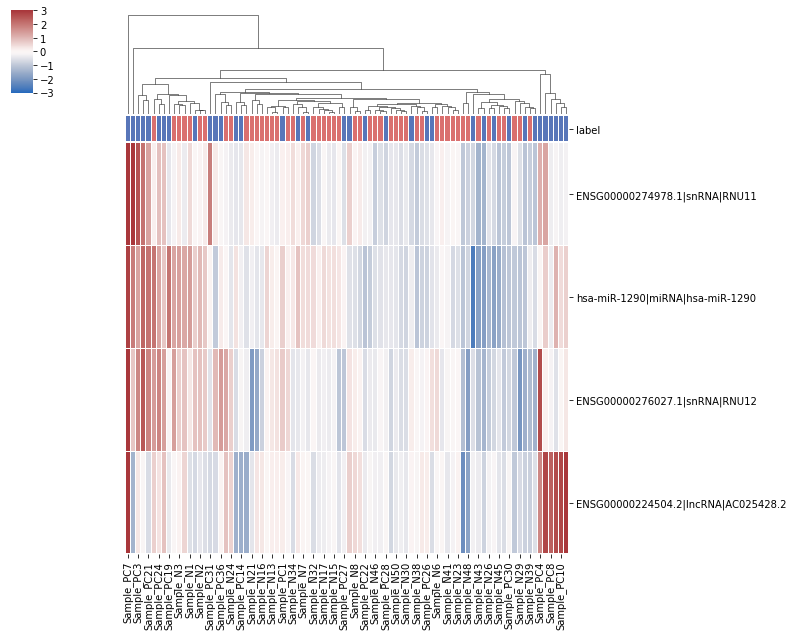

In [75]:
de_mx.iloc[:20]
type_select = pd.DataFrame(sample_class.loc[i] for i in de_mx.columns)
type_color = dict(zip(np.unique(type_select), ("#DA706F","#5876B9")))
column_colors = type_select['label'].map(type_color)
import seaborn as sns
#fig, ax = plt.subplots(figsize=(7,7))
tmpind = de_mx.index
tmpind = np.array([tmpind[i].split('|')[0]+'|'+tmpind[i].split('|')[1]+'|'+tmpind[i].split('|')[2] for i in range(tmpind.shape[0])])
de_mx.index = tmpind
g = sns.clustermap(de_mx, row_cluster=False,cmap="vlag",
               col_colors=column_colors,linewidths=.005,vmax=3,vmin=-3)#,z_score=0)

In [77]:
mat = original_mx
factor = mat.sum(axis=0)/np.mean(mat.sum(axis=0))
norm_mx = (mat/factor+1).apply(np.log2,0)

for compare_group in compare_group_list:
    if compare_group=='Normal-CRC_S1':
        class_compare = np.array([ 'Colorectal Cancer Stage 1', 'Healthy Control'])
    if compare_group=='Normal-CRC_S1':
        class_compare = np.array([ 'Colorectal Cancer Stage 1', 'Healthy Control'])
    if compare_group=='Normal-CRC_S1':
        class_compare = np.array([ 'Colorectal Cancer Stage 1', 'Healthy Control'])
    if compare_group=='Normal-CRC_S1':
        class_compare = np.array([ 'Colorectal Cancer Stage 1', 'Healthy Control'])
    if compare_group == 'Normal-CRC':
        class_select = ['Healthy Control','Colorectal Cancer']
    if compare_group == 'Normal-PAAD':
        class_select = ['Healthy Control','Pancreatic Cancer']
    if compare_group == 'Normal-PRAD':
        class_select = ['Healthy Control','Prostate Cancer']
    ## z score
    norm_mx_delete = norm_mx
    for i in norm_mx_delete.columns:
        if not np.isin(sample_class.loc[i]['label'],class_select):
            norm_mx_delete = norm_mx_delete.drop(columns=[i])
    norm_z_mx = norm_mx_delete.apply(scipy.stats.zscore,1)
    ## delete

    detable = pd.read_table('output/'+dataset+'/differential_expression/'+exp_mx_name+'/'+compare_group+'/deseq2.txt'
                            ,index_col=0)
    de_plot_mx = pd.DataFrame(data={'feature':[name.split('|')[0] for name in detable.index.values],
                              'log2FoldChange':detable['log2FoldChange'].tolist(),
                              'padj':detable['padj'].tolist()})
    de_plot_mx.set_index('feature',inplace=True)
    de_plot_mx['threshold'] = (abs(de_plot_mx['log2FoldChange'])>1) & (de_plot_mx['padj']<0.05)
    de_plot_mx['-log10(q values)'] = [-math.log10(qvalue) for qvalue in de_plot_mx['padj'].tolist()]

    de_mx = norm_z_mx.loc[detable.sort_values('padj').iloc[np.where(de_plot_mx.sort_values('-log10(q values)',ascending=False)['threshold']==True)].index]
    #display(de_plot_mx.sort_values('-log10(q values)',ascending=False))
    #display(de_mx)
    #display(detable.sort_values('padj').iloc[np.where(de_plot_mx.sort_values('-log10(q values)',ascending=False)['threshold']==True)].index)
    ## add cbar
    de_mx.iloc[:20]
    type_select = pd.DataFrame(sample_class.loc[i] for i in de_mx.columns)
    type_color = dict(zip(np.unique(type_select), ("#DA706F","#5876B9")))
    column_colors = type_select['label'].map(type_color)
    import seaborn as sns
    #fig, ax = plt.subplots(figsize=(7,7))
    #tmpind = de_mx.index
    #tmpind = np.array([tmpind[i].split('|')[0]+'|'+tmpind[i].split('|')[1]+'|'+tmpind[i].split('|')[2] for i in range(tmpind.shape[0])])
    #de_mx.index = tmpind
    g = sns.clustermap(de_mx, row_cluster=False,cmap="vlag",
                   col_colors=column_colors,linewidths=.005,vmax=3,vmin=-3)#,z_score=0)
    #plt.tight_layout()
    g.savefig(savepath+compare_group+'_DE_heatmap.pdf')
    #download_figure(compare_group,format='eps')
    with embed_pdf_data() as data:
        #g = sns.clustermap(m)
        g.savefig(data, format='pdf', metadata={'Title': compare_group})
    #embed_pdf_figure(960,320)

In [56]:
def heamap_plot(mat,sample_class):
    factor = mat.sum(axis=0)/np.mean(mat.sum(axis=0))
    norm_mx = (mat/factor+1).apply(np.log2,0)

    for compare_group in compare_group_list:
        if compare_group=='Normal-CRC_S1':
            class_compare = np.array([ 'Colorectal Cancer Stage 1', 'Healthy Control'])
        if compare_group=='Normal-CRC_S1':
            class_compare = np.array([ 'Colorectal Cancer Stage 1', 'Healthy Control'])
        if compare_group=='Normal-CRC_S1':
            class_compare = np.array([ 'Colorectal Cancer Stage 1', 'Healthy Control'])
        if compare_group=='Normal-CRC_S1':
            class_compare = np.array([ 'Colorectal Cancer Stage 1', 'Healthy Control'])
        if compare_group == 'Normal-CRC':
            class_select = ['Healthy Control','Colorectal Cancer']
        if compare_group == 'Normal-PAAD':
            class_select = ['Healthy Control','Pancreatic Cancer']
        if compare_group == 'Normal-PRAD':
            class_select = ['Healthy Control','Prostate Cancer']
        ## z score
        norm_mx_delete = norm_mx
        for i in norm_mx_delete.columns:
            if not np.isin(sample_class.loc[i]['label'],class_select):
                norm_mx_delete = norm_mx_delete.drop(columns=[i])
        norm_z_mx = norm_mx_delete.apply(scipy.stats.zscore,1)
        ## delete
        
        detable = pd.read_table('output/'+dataset+'/differential_expression/'+exp_mx_name+'/'+compare_group+'/deseq2.txt'
                                ,index_col=0)
        de_plot_mx = pd.DataFrame(data={'feature':[name.split('|')[0] for name in detable.index.values],
                                  'log2FoldChange':detable['log2FoldChange'].tolist(),
                                  'padj':detable['padj'].tolist()})
        de_plot_mx.set_index('feature',inplace=True)
        de_plot_mx['threshold'] = (abs(de_plot_mx['log2FoldChange'])>1) & (de_plot_mx['padj']<0.05)
        de_plot_mx['-log10(q values)'] = [-math.log10(qvalue) for qvalue in de_plot_mx['padj'].tolist()]
        
        de_mx = norm_z_mx.loc[detable.sort_values('padj').iloc[np.where(de_plot_mx.sort_values('-log10(q values)',ascending=False)['threshold']==True)].index]
        #display(de_plot_mx.sort_values('-log10(q values)',ascending=False))
        #display(de_mx)
        #display(detable.sort_values('padj').iloc[np.where(de_plot_mx.sort_values('-log10(q values)',ascending=False)['threshold']==True)].index)
        ## add cbar
        de_mx.iloc[:20]
        type_select = pd.DataFrame(sample_class.loc[i] for i in de_mx.columns)
        type_color = dict(zip(np.unique(type_select), ("#DA706F","#5876B9")))
        column_colors = type_select['label'].map(type_color)
        import seaborn as sns
        #fig, ax = plt.subplots(figsize=(7,7))
        tmpind = de_mx.index
        tmpind = np.array([tmpind[i].split('|')[0]+'|'+tmpind[i].split('|')[1]+'|'+tmpind[i].split('|')[2] for i in range(tmpind.shape[0])])
        de_mx.index = tmpind
        g = sns.clustermap(de_mx, row_cluster=False,cmap="vlag",
                       col_colors=column_colors,linewidths=.005,vmax=3,vmin=-3)#,z_score=0)
        #plt.tight_layout()
        g.savefig(savepath+compare_group+'_DE_heatmap.pdf')
        #download_figure(compare_group,format='eps')
        with embed_pdf_data() as data:
            #g = sns.clustermap(m)
            g.savefig(data, format='pdf', metadata={'Title': compare_group})
        #embed_pdf_figure(960,320)
heamap_plot(original_mx,sample_class)

# Matrix processing

In [204]:
def null_name(string):
    if string =='null':
        return '.null'
    else:
        return '.'+string
    
def generate_processed_filename(original_mx_file,imputation_method,normalization_method,batch_removal_method,batch_index): 
    imputename = null_name(imputation_method)
    normname = null_name(normalization_method)
    batchname = null_name(batch_removal_method)
    if batch_index=='null':
        batchindname = ''
    else:
        batchindname = '_'+batch_index
    return'filter'+imputename+normname+batchname+batchindname+'.'+original_mx_file.split('/')[-1]

In [205]:
def get_best_preprocess_methods(output_dir,preselected_methods_dir, title=None, criterion='roc_auc'):
    records = []
    pbar = tqdm(unit='directory')
    for preprocess_method in preselected_methods_dir:#os.listdir(output_dir):
        for compare_group in os.listdir(os.path.join(output_dir, preprocess_method)):
            for feature_selection_method in os.listdir(os.path.join(output_dir, preprocess_method, compare_group)):
                classifier, n_select, select_method, fold_change_direction  = feature_selection_method.split('.')
                record = {
                    'compare_group': compare_group,
                    'classifier': classifier,
                    'n_features': n_select,
                    'fold_change_direction': fold_change_direction,
                    'preprocess_method': preprocess_method
                }
                try:
                    metrics = pd.read_table(os.path.join(output_dir,
                        preprocess_method, compare_group, feature_selection_method,
                        'metrics.test.txt'), sep='\t', index_col=0)
                except:
                    continue
                for metric_name in metrics.columns:
                    record[metric_name] = metrics[metric_name].mean()
                #record['test_roc_auc_mean'] = metrics['test_roc_auc'].mean()
                pbar.update(1)
                records.append(record)
    pbar.close()
    records = pd.DataFrame.from_records(records)
    records['n_features'] = records.loc[:, 'n_features'].astype(np.int32)
    
    best_preprocess_methods = {}
    #with embed_pdf_pages() as pdf:
    for compare_group, sub_df in records.groupby(['compare_group', 'fold_change_direction', 'classifier']):
        pivot = sub_df.pivot_table(
            index='preprocess_method', columns='n_features', values=criterion)
        #print(pivot.iloc[:, 0])
        #print(np.argsort(np.argsort(pivot.values, axis=0), axis=0)[:, 0])
        mean_ranks = np.mean(pivot.shape[0] - np.argsort(np.argsort(pivot.values, axis=0), axis=0), axis=1)
        mean_ranks = pd.Series(mean_ranks, index=pivot.index.values)
        mean_ranks = mean_ranks.sort_values()
        rename_index = ['{} (rank = {:.1f})'.format(name, value) for name, value in zip(mean_ranks.index, mean_ranks.values)]
        rename_index = pd.Series(rename_index, index=mean_ranks.index.values)
        sub_df = sub_df.copy()
        sub_df['preprocess_method'] = rename_index[sub_df['preprocess_method'].values].values
        sub_df['n_features'] = sub_df['n_features'].astype('int')
        sub_df = sub_df.sort_values(['preprocess_method', 'n_features'], ascending=True)
        sub_df['n_features'] = sub_df['n_features'].astype('str')
        #fig, ax = plt.subplots(figsize=(12, 7))
        if sub_df['n_features'].unique().shape[0] > 1:
            # draw a line for each preprocess method
            for preprocess_method in rename_index.values:
                tmp_df = sub_df[sub_df['preprocess_method'] == preprocess_method]
               # ax.plot(np.arange(tmp_df.shape[0]) + 1, tmp_df[criterion], label=preprocess_method)
                #ax.set_xticks(np.arange(tmp_df.shape[0]) + 1)
                #ax.set_xticklabels(tmp_df['n_features'])
            #ax.set_xlabel('Number of features')
            #ax.set_ylabel('Average {}'.format(criterion))
            #ax.legend(title='Preprocess method', bbox_to_anchor=(1.04,0.5), 
           #             loc="center left", borderaxespad=0)
           # ax.set_ylim(0.5, 1)
           # ax.set_title(compare_group)
        else:
            tmp_df = sub_df.copy()
            tmp_df = tmp_df.sort_values(criterion, ascending=False)
           # ax.barh(tmp_df['preprocess_method'], tmp_df[criterion], color='gray')
           # ax.set_ylabel('Preprocess method')
           # ax.set_xlabel('Average {}'.format(criterion))
           # ax.set_xlim(0, 1)
           # ax.set_title(compare_group)
            
            #best_preprocess_methods[compare_group] = sub_df.iloc[0]['preprocess_method']
            best_preprocess_methods[compare_group] =best_preprocess_methods[compare_group] = mean_ranks.index[0]
            #fig.tight_layout()
            #pdf.savefig(fig)
            #plt.close()
    return best_preprocess_methods
#use uca to presort methods
preselected_methods = np.loadtxt('output/'+dataset+'/select_preprocess_method/uca_score/'+exp_mx_name+'/selected_methods.txt',dtype='str')
preselected_methods_dir = np.array([preselected_methods[i]+'.'+exp_mx_name for i in range(preselected_methods.shape[0])])


best_preprocess_methods = get_best_preprocess_methods('output/scirep/cross_validation',preselected_methods_dir)

HBox(children=(IntProgress(value=1, bar_style='info', max=1), HTML(value='')))

In [230]:
matrix_processing_path = 'output/'+dataset+'/matrix_processing/'
selected_best_method_best = best_preprocess_methods[example_cancer,value_change,classifier_use]#.split(' ')[0]
imputation_method = selected_best_method_best.split('.')[1]
normalization_method = selected_best_method_best.split('.')[2]
batch_removal_method = selected_best_method_best.split('.')[3]
batch_index = 'null'
if dataset=='scirep':
    if stage_info =='No Stage':
        class_info = 'data/'+dataset+'/sample_classes.no_stage.txt'
    else:
        class_info = 'data/'+dataset+'/sample_classes.txt'
batch_info = 'data/'+dataset+'/batch_info.txt'
original_mx_file = 'output/'+dataset+'/count_matrix/'+exp_mx_name+'.txt'

original_mx = pd.read_table(original_mx_file,index_col=0)
processed_mx = pd.read_table(matrix_processing_path+generate_processed_filename(\
            original_mx_file,imputation_method,normalization_method,batch_removal_method,batch_index),index_col=0)
sample_class = pd.read_table(class_info,sep='\t',index_col=0)
batchtable = pd.read_table(batch_info,sep='\t',index_col=0)


## abundance and diversity

In [400]:
def div_abu_plot(expression_mx,savefig=True):
    #### Diversity matrix
    type_counts_sample = pd.DataFrame()
    for samplename in expression_mx.columns.values:
        #names_[samplename] = expression_mx[samplename].index

        filter_zero_samplename = expression_mx.iloc[np.where(expression_mx[samplename]>0)[0],:]
        names = filter_zero_samplename.index
        names_type = np.array([names[i].split('|')[1] for i in range(names.shape[0])])
        type_counts = np.unique(names_type, return_counts = True)
        new = pd.DataFrame({'type' : type_counts[0],
                            samplename : type_counts[1],
                           })
        new = new.set_index('type')
        type_counts_sample = pd.concat([type_counts_sample, new], axis=1)#, join_axes=[df1.index]
    
    #expression_mx = original_mx
    typelist = np.unique([expression_mx.index[i].split('|')[1] for i in range(expression_mx.shape[0])])
    type_mx = pd.DataFrame(index=typelist,columns=expression_mx.columns)
    for sample in expression_mx.columns:
        sample_feature = pd.DataFrame(data=expression_mx.loc[:,sample],index=expression_mx.index)
        sample_feature['type']=[expression_mx.index[i].split('|')[1] for i in range(expression_mx.shape[0])]
        for i in typelist:
            #print(i,sample,sample_feature.iloc[np.where(sample_feature['type']==i)].iloc[:,0].sum())
            type_mx.loc[i,sample] = sample_feature.iloc[np.where(sample_feature['type']==i)].iloc[:,0].sum()
    table_ratio = (type_mx/type_mx.sum()).T
    ####mean_sd matrix
    xticks = type_counts_sample.index.tolist()
    Means = type_counts_sample.mean(axis=1).values.tolist()
    Std=type_counts_sample.std(axis=1).values.tolist()
    mean_sd = pd.DataFrame(data = {'type':xticks,'mean':Means,'std':Std})
    mean_sd = mean_sd.sort_values(by='mean',ascending=False)
    mean_sd = mean_sd.set_index('type')
    Std = [[0]*len(mean_sd['std'].tolist()),mean_sd['std'].tolist()]
    ab = table_ratio*100
    #ab['genomic'] = ab['intron'] + ab['promoter'] + ab['enhancer'] + ab['repeats'] + ab['circRNA'] +ab['other']
    xticks_ab = ab.columns.tolist()
    Means_ab = ab.mean(axis=0).values.tolist()
    Std_ab = ab.std(axis=0).values.tolist()
    mean_sd_ab = pd.DataFrame(data = {'type':xticks_ab,'mean_ab':Means_ab,'std_ab':Std_ab})
    mean_sd_ab = mean_sd_ab.set_index('type')
    N = type_counts_sample.shape[0]
    ind = np.arange(N)
    merge = pd.concat([mean_sd,mean_sd_ab],axis=1,join_axes=[mean_sd.index])
    Std_ab = [[0]*len(merge['std_ab'].tolist()),merge['std_ab'].tolist()]
    xticks = merge.index.tolist()
    ####plot
    plt.rcParams['figure.dpi'] = 300    
    fig,(ax,ax1) = plt.subplots(1,2,figsize = (7,3.5))
    ax.barh(ind,merge['mean'],0.7,xerr=Std,color='grey')
    ax.invert_xaxis()
    ax = std_plot(ax,'Number of detected genes','','Diversity',left=False,ylim=[-0.5,10.5])#,ylim=[np.min(ind),np.max(ind)]
    ax.set_yticks(ind)
    #ax.set_yticks([])
    ax1.barh(ind,merge['mean_ab'],0.7,xerr=Std_ab,color="grey",)
    ax1.set_yticks(ind)
    ax1.set_yticklabels(xticks)
    ax1 = std_plot(ax1,'Percentage of mapped reads (%)','','Abundance',ylim=[-0.5,10.5])
    if savefig is True:
        fig.savefig('diversity_abundance.eps')
    embed_pdf_figure()    

div_abu_plot(expression_mx=original_mx,savefig=True)

## filtering effect

In [208]:
def plot_bar_for_filter(expression_mx,cutoff_ratio = 0.2,counts_threshold = 10 ):
    retain_index = np.where(np.sum(expression_mx > counts_threshold,axis=1) >=round(cutoff_ratio*expression_mx.shape[1]))[0]
    filter_mx = expression_mx.iloc[retain_index,:]
    names = expression_mx.index
    names_ = filter_mx.index
    names_type = np.array([names[i].split('|')[1] for i in range(names.shape[0])])
    type_counts = np.unique(names_type, return_counts = True)
    names_type_ = np.array([names_[i].split('|')[1] for i in range(names_.shape[0])])
    type_counts_ = np.unique(names_type_, return_counts = True)
    typedataframe = pd.DataFrame(np.concatenate((type_counts[0].reshape(-1,1),type_counts[1].reshape(-1,1)),axis=1))
    typedataframe.columns = ['type','counts']
    typedataframe_ = pd.DataFrame(np.concatenate((type_counts_[0].reshape(-1,1),type_counts_[1].reshape(-1,1)),axis=1))
    typedataframe_.columns = ['type','counts']
    typedataframe.counts = pd.to_numeric(typedataframe.counts)
    typedataframe_.counts = pd.to_numeric(typedataframe_.counts)
    dataall = pd.concat((typedataframe,typedataframe_))
    operation = np.concatenate((np.repeat('original',typedataframe.shape[0]),
                                           np.repeat('filter',typedataframe.shape[0])))

    dataall['operation'] = operation
    fig,ax=plt.subplots(1,figsize=(7, 3))
    sns.barplot(ax=ax,data=dataall,x='type',y='counts',hue='operation')
    #ax.set_title('samples with expression value higher than '+str(counts_threshold) +
    #                ' are more than '+str(round(cutoff_ratio*100))+'%',fontsize=26)
    std_plot(ax,'type','counts',
             'samples with expression value higher than '+str(counts_threshold) +
             ' are more than '+str(round(cutoff_ratio*100))+'%',legendtitle='operation',legendsort=False,borderpad=1,handletextpad=1)
    print (expression_mx.shape[0],' original feature')
    print (retain_index.shape[0],' feature remained')
plot_bar_for_filter(original_mx,cutoff_ratio = 0.1 ,counts_threshold = 10 )
embed_pdf_figure()

19241  original feature
6050  feature remained


In [209]:
def plot_bar_for_filter_cpm(expression_mx,cutoff_ratio = 0.2,counts_threshold = 10):
    exshape = expression_mx.shape[0]
    cpm_mat = expression_mx/expression_mx.sum(axis=0)*10e6
    length_tmp = np.array([cpm_mat.index[i].split('|')[-1] for i in range(cpm_mat.index.shape[0])]).astype('int')-\
    np.array([cpm_mat.index[i].split('|')[-2] for i in range(cpm_mat.index.shape[0])]).astype('int')
    rpkm_mat = (cpm_mat.T/length_tmp*1000).T
    if sequencing_type=='short': #cpm
        expression_mx = cpm_mat
        matname = 'CPM'
    if sequencing_type=='long': #rpm
        expression_mx = rpkm_mat 
        matname = 'RPKM'
    retain_index = np.where(np.sum(expression_mx > counts_threshold,axis=1) >=round(cutoff_ratio*expression_mx.shape[1]))[0]
    filter_mx = expression_mx.iloc[retain_index,:]
    names = expression_mx.index
    names_ = filter_mx.index
    names_type = np.array([names[i].split('|')[1] for i in range(names.shape[0])])
    type_counts = np.unique(names_type, return_counts = True)
    names_type_ = np.array([names_[i].split('|')[1] for i in range(names_.shape[0])])
    type_counts_ = np.unique(names_type_, return_counts = True)
    typedataframe = pd.DataFrame(np.concatenate((type_counts[0].reshape(-1,1),type_counts[1].reshape(-1,1)),axis=1))
    typedataframe.columns = ['type','counts']
    typedataframe_ = pd.DataFrame(np.concatenate((type_counts_[0].reshape(-1,1),type_counts_[1].reshape(-1,1)),axis=1))
    typedataframe_.columns = ['type','counts']
    typedataframe.counts = pd.to_numeric(typedataframe.counts)
    typedataframe_.counts = pd.to_numeric(typedataframe_.counts)
    dataall = pd.concat((typedataframe,typedataframe_))
    operation = np.concatenate((np.repeat('original',typedataframe.shape[0]),
                                           np.repeat('filter',typedataframe.shape[0])))
    dataall['operation'] = operation
    fig,ax=plt.subplots(1,figsize=(7 , 3))
    sns.barplot(ax=ax,data=dataall,x='type',y='counts',hue='operation')
    #ax.set_title('Samples with '+matname+' expression value higher than '+str(counts_threshold) +
    #                ' are more than '+str(round(cutoff_ratio*100))+'%',fontsize=26)
    std_plot(ax,'type','counts',
             'Samples with '+matname+' expression value higher than '+str(counts_threshold) +
             ' are more than '+str(round(cutoff_ratio*100))+'%',
             legendtitle='operation',legendsort=False,borderpad=1,handletextpad=1)
    print (exshape,' original feature')
    print (retain_index.shape[0],' feature remained')
plot_bar_for_filter_cpm(original_mx,cutoff_ratio = 0.1 ,counts_threshold = 10 )
fig.tight_layout()
embed_pdf_figure()


19241  original feature
6129  feature remained


## relative log expression

TO DO

## expression vs read depth

TO DO

## define clustering score

In [210]:
def alignment_score(X, y, K=10):
    N = X.shape[0]
    nn = NearestNeighbors(K)
    nn.fit(X)
    distances, indices = nn.kneighbors(X, K + 1)
    neighbor_classes = np.take(y, indices[:, 1:])
    same_class_fractions = np.sum(neighbor_classes == y[:, np.newaxis], axis=1)
    score = 1.0 - (np.mean(same_class_fractions) - K/N)/(K - K/N)
    print (same_class_fractions.shape,np.mean(same_class_fractions),K/N,neighbor_classes)
    return score
def knn_score(X, y, K=10):
    N = X.shape[0]
    assert K < N
    nn = NearestNeighbors(K)
    nn.fit(X)
    distances, indices = nn.kneighbors(X, K + 1)
    neighbor_classes = np.take(y, indices[:, 1:])
    same_class_fractions = np.sum(neighbor_classes == y[:, np.newaxis], axis=1)
    classes, counts = np.unique(y, return_counts=True)
    classes = np.argmax(y.reshape((-1, 1)) == classes.reshape((1, -1)), axis=1)
    counts = np.take(counts, classes)
    mean_r = K/(N - 1)*counts
    max_r = np.minimum(K, counts)
    #print (same_class_fractions.shape,mean_r.shape,max_r.shape)
    #scores = (np.mean(same_class_fractions) - mean_r)/(max_r - mean_r)
    scores = (same_class_fractions - mean_r)/(max_r - mean_r)
    #print(scores)
    return scores.mean()
def convert_label_to_int(sample_class):
    classes, counts = np.unique(sample_class, return_counts=True)
    classes = np.argmax(sample_class.reshape((-1, 1)) == classes.reshape((1, -1)), axis=1)
    return classes
def unsupervised_clustering_accuracy(y, y_pred):
    """
    Unsupervised Clustering Accuracy
    """
    from sklearn.utils.linear_assignment_ import linear_assignment
    assert len(y_pred) == len(y)
    u = np.unique(np.concatenate((y, y_pred)))
    n_clusters = len(u)
    mapping = dict(zip(u, range(n_clusters)))
    reward_matrix = np.zeros((n_clusters, n_clusters), dtype=np.int64)
    for y_pred_, y_ in zip(y_pred, y):
        if y_ in mapping:
            reward_matrix[mapping[y_pred_], mapping[y_]] += 1
    cost_matrix = reward_matrix.max() - reward_matrix
    ind = linear_assignment(cost_matrix)
    return sum([reward_matrix[i, j] for i, j in ind]) * 1.0 / y_pred.size, ind
def clustering_scores(X,y, prediction_algorithm='knn'):
    from sklearn.metrics import adjusted_rand_score as ARI
    from sklearn.metrics import normalized_mutual_info_score as NMI
    from sklearn.metrics import silhouette_score
    from sklearn.mixture import GaussianMixture as GMM
    from sklearn.cluster import KMeans
    
    cluster_num = np.unique(y).shape[0]
    if prediction_algorithm == 'knn':
        labels_pred = KMeans(cluster_num, n_init=200).fit_predict(X)  
    elif prediction_algorithm == 'gmm':
        gmm = GMM(cluster_num)
        gmm.fit(X)
        labels_pred = gmm.predict(X)
    labels = y
    asw_score = silhouette_score(X, labels)
    nmi_score = NMI(labels, labels_pred)
    ari_score = ARI(labels, labels_pred)
    labels_int = convert_label_to_int(labels)
    uca_score = unsupervised_clustering_accuracy(labels_int, labels_pred)[0]
    return asw_score, nmi_score, ari_score, uca_score

def uca_scores(X,y, prediction_algorithm='knn'):
    from sklearn.cluster import KMeans
    
    cluster_num = np.unique(y).shape[0]
    if prediction_algorithm == 'knn':
        labels_pred = KMeans(cluster_num, n_init=200).fit_predict(X)  
    elif prediction_algorithm == 'gmm':
        gmm = GMM(cluster_num)
        gmm.fit(X)
        labels_pred = gmm.predict(X)
    labels = y
    labels_int = convert_label_to_int(labels)
    uca_score = unsupervised_clustering_accuracy(labels_int, labels_pred)[0]
    return uca_score

def get_clustering_score(data,sampleclass,method = 'PCA',prediction_algorithm='knn'):
    X = np.log2(data + 0.001).T
    X = StandardScaler().fit_transform(X)
    if method == 'PCA':
        transform = PCA()
    elif method == 'tSNE':
        transform = TSNE()
    elif method == 'UMAP':
        transform = umap.UMAP(n_neighbors=5,min_dist=0.3,metric='correlation')
    
    #X_pca = transform.fit_transform(X)
    X_, y_ = X, sampleclass.loc[data.columns.values].values.ravel() 
    #knn_score_ = knn_score(X_, y_)
    #asw_score, nmi_score, ari_score, uca_score = clustering_scores(X_, y_, prediction_algorithm)
    uca_score = uca_scores(X_, y_, prediction_algorithm)
    return uca_score

## plot UCA score of different methods

In [211]:
uca_summary = pd.read_table('output/'+dataset+'/select_preprocess_method/uca_score/'+exp_mx_name+'/summary.txt',
                           index_col=0)
                            

In [212]:
uca_summary_table = pd.DataFrame(np.ndarray([uca_summary.shape[0],4]))
uca_summary_table.columns = ['imputation','normalization','batch_removal','uca_score']
for i in range(uca_summary.shape[0]):
    splittmp = uca_summary.index[i].split('.')
    uca_summary_table.iloc[i,0] = splittmp[1]
    uca_summary_table.iloc[i,1] = splittmp[2]
    uca_summary_table.iloc[i,2] = splittmp[3]
    uca_summary_table.iloc[i,3] = uca_summary.values[i]

In [213]:
display_dataframe(uca_summary_table.groupby(uca_summary_table.columns[0]).mean(),filename='Imputation Methods UCA Score',gradientfunc=False)
display_dataframe(uca_summary_table.groupby(uca_summary_table.columns[1]).mean(),filename='Normalization Methods UCA Score',gradientfunc=False)
display_dataframe(uca_summary_table.groupby(uca_summary_table.columns[2]).mean(),filename='Batch Removal Methods UCA Score',gradientfunc=False)
uca_mean_summary = pd.concat((uca_summary_table.groupby(uca_summary_table.columns[0]).mean(),
          uca_summary_table.groupby(uca_summary_table.columns[1]).mean(),
          uca_summary_table.groupby(uca_summary_table.columns[2]).mean()))
uca_mean_summary =  uca_mean_summary.rename(index={'null': 'imputation_null'})

,uca_score
imputation,
null,0.27
scimpute_count,0.261875
viper_count,0.281042


,uca_score
normalization,
Norm_CPM,0.268403
Norm_CPM_top,0.257292
Norm_RLE,0.266319
Norm_SCnorm,0.282639
Norm_TMM,0.280208


,uca_score
batch_removal,
Batch_Combat_1,0.276736
Batch_Combat_2,0.269792
Batch_Combat_3,0.253472
Batch_RUV,0.299306
Batch_null,0.255556


In [483]:
fig, ax = plt.subplots(1,figsize=(7, 4))
uca_mean_summary.plot(kind='bar',ax=ax,width=0.8,
                legend=True)
std_plot(ax,'','')
legend = ax.legend(prop=fontlegend,
              bbox_to_anchor=[0.2,1],
              borderpad=1,
              edgecolor="#000000",fancybox=False)
ax.legend_.get_frame()._linewidth=0.5
legend.get_title().set_fontweight('normal')
legend.get_title().set_fontsize(6.5)
fig.tight_layout()

embed_pdf_figure()

## PCA, tSNE and UMAP plot

In [484]:
def PCA_plot_with_uca_score_sns(ax,data,sampleclass,method = 'PCA'):
    X = np.log2(data + 0.001).T
    X = StandardScaler().fit_transform(X)
    if method == 'PCA':
        transform = PCA()
    elif method == 'tSNE':
        transform = TSNE()
    elif method == 'UMAP':
        transform = umap.UMAP(n_neighbors=5,min_dist=0.3,metric='correlation')
    
    X_pca = transform.fit_transform(X)
    plot_table = pd.DataFrame(X_pca[:,:2])
    plot_table.index = data.columns
    plot_table = pd.concat((plot_table,sampleclass.loc[plot_table.index]),axis=1)
    plot_table.columns = ['dimension_1','dimension_2','class']
    classnum = np.unique(plot_table.iloc[:,2]).shape[0]
    sns.scatterplot(ax=ax,data=plot_table,x="dimension_1", y="dimension_2",
                    palette=np.array(Category20c[20]).reshape(4,-1).T.ravel()[:classnum],hue="class",style='class',s=30)
    #plt.figure(linewidth=30.5)
    #ax.spines['right'].set_visible(False)
    #ax.spines['top'].set_visible(False)
    uca_score = get_clustering_score(data, sampleclass)
    #ax.set_title('UCA score: {:.6f}'.format(uca_score))
    #ax.annotate('UCA score: {:.6f}'.format(uca_score),xy=(1,0),xycoords='data',size=6.5)
    #print('Alignment score: {}'.format(knn_score(X_pca, sampleclass.loc[data.columns.values].values.ravel() )))
    return uca_score

In [485]:
def visualize_effect(original_mx,processed_mx,sample_class,method='PCA'):
    fig, ax = plt.subplots(1,2,figsize=(10,5))
    ucascore = PCA_plot_with_uca_score_sns(ax[0],original_mx,sample_class,method)
    std_plot(ax[0],title='Original matrix '+'UCA score: {:.6f}'.format(ucascore),xlabel='Dimension 1',ylabel='Dimension 2',
             legendtitle='Class',sns=True,legendsort=False,markerscale=0.2,borderpad=0.5)
    ucascore = PCA_plot_with_uca_score_sns(ax[1],processed_mx,sample_class,method)
    std_plot(ax[1],title='Processed matrix '+'UCA score: {:.6f}'.format(ucascore),xlabel='Dimension 1',ylabel='Dimension 2',
             legendtitle='Class',sns=True,legendsort=False,markerscale=0.2,borderpad=0.5)

In [486]:
visualize_effect(original_mx,processed_mx,sample_class,method='UMAP')
embed_pdf_figure()

In [487]:
df = pd.DataFrame.from_records([list(key) + [value] for key, value in best_preprocess_methods.items()])
df.columns = ['compare_group','value_change','classifier','preprocess_method']
tmpdict = {}
for i in df[(df['value_change']==value_change)&(df['classifier']==classifier_use)]['compare_group'].index:
    tmpdict[df[(df['value_change']==value_change)&(df['classifier']==classifier_use)]['compare_group'].loc[i]] = \
    df[(df['value_change']==value_change)&(df['classifier']==classifier_use)]['preprocess_method'].loc[i]

In [488]:
imputation_method = tmpdict[example_cancer].split('.')[1]
normalization_method = tmpdict[example_cancer].split('.')[2]
batch_removal_method = tmpdict[example_cancer].split('.')[3]

impute_table = pd.read_table('output/'+dataset+'/matrix_processing/filter.'+imputation_method +'.'+exp_mx_name+'.txt')
normalize_table = pd.read_table('output/'+dataset+'/matrix_processing/filter.'+imputation_method +'.'+normalization_method+'.'+exp_mx_name+'.txt',index_col=0)
batch_table = pd.read_table('output/'+dataset+'/matrix_processing/filter.'+imputation_method+'.'+normalization_method+'.'+batch_removal_method+'.'+exp_mx_name+'.txt',index_col=0)


In [489]:
def visualize_effect_all(original_mx,impute_mx, normalize_mx, batch_mx, sample_class,method='PCA'):
    fig, ax = plt.subplots(2,2,figsize=(10,10))
    ucalist = pd.DataFrame(index=['Original matrix','Imputed matrix','Normalized matrix','Batch-removed matrix'])
    ucalist[0]=None
    #uca_rna_mx[rnatype]['Original matrix']
    ucalist[0][0] = PCA_plot_with_uca_score_sns(ax[0,0],original_mx,sample_class,method)
    std_plot(ax[0,0],title='Original matrix '+'UCA score: {:.6f}'.format(ucalist[0][0]),xlabel='Dimension 1',ylabel='Dimension 2',
             legendtitle='Class',sns=True,legendsort=False,markerscale=0.2,borderpad=0.5)
    ucalist[0][1] = PCA_plot_with_uca_score_sns(ax[0,1],impute_mx,sample_class,method)
    std_plot(ax[0,1],title='Imputed matrix '+'UCA score: {:.6f}'.format(ucalist[0][1]),xlabel='Dimension 1',ylabel='Dimension 2',
             legendtitle='Class',sns=True,legendsort=False,markerscale=0.2,borderpad=0.5)
    ucalist[0][2] = PCA_plot_with_uca_score_sns(ax[1,0],normalize_mx,sample_class,method)
    std_plot(ax[1,0],title='Normalized matrix '+'UCA score: {:.6f}'.format(ucalist[0][2]),xlabel='Dimension 1',ylabel='Dimension 2',
             legendtitle='Class',sns=True,legendsort=False,markerscale=0.2,borderpad=0.5)
    ucalist[0][3] = PCA_plot_with_uca_score_sns(ax[1,1],batch_mx,sample_class,method)
    std_plot(ax[1,1],title='Batch-removed matrix '+'UCA score: {:.6f}'.format(ucalist[0][3]),xlabel='Dimension 1',ylabel='Dimension 2',
             legendtitle='Class',sns=True,legendsort=False,markerscale=0.2,borderpad=0.5)
    return fig,ucalist

def visualize_effect_final(original_mx,final_mx, sample_class,method='PCA'):
    fig, ax = plt.subplots(1,2,figsize=(10,5))
    ucascore = PCA_plot_with_uca_score_sns(ax[0],original_mx,sample_class,method)
    std_plot(ax[0],title='Original matrix '+'UCA score: {:.6f}'.format(ucascore),xlabel='Dimension 1',ylabel='Dimension 2',
             legendtitle='Class',sns=True,legendsort=False,markerscale=0.2,borderpad=0.5)
    ucascore = PCA_plot_with_uca_score_sns(ax[1],final_mx,sample_class,method)
    std_plot(ax[1],title='Processed matrix '+'UCA score: {:.6f}'.format(ucascore),xlabel='Dimension 1',ylabel='Dimension 2',
             legendtitle='Class',sns=True,legendsort=False,markerscale=0.2,borderpad=0.5)

In [490]:
visualize_effect_final(original_mx,processed_mx, sample_class,method='UMAP')
embed_pdf_figure()

In [491]:
visualize_effect_all(original_mx, impute_table, normalize_table, batch_table, sample_class,method='UMAP')
embed_pdf_figure(title='UCA score of matrices through four procedures')


## top K feature

In [75]:
def plot_top20(expression_mx):
    em = expression_mx
    em_ratio = em/em.sum(axis=0)
    em_sum = em.sum(axis=1)
    featurename = pd.DataFrame(em_sum.sort_values(ascending=False)).iloc[:20].index.values.tolist()
    em_top = em_ratio.iloc[np.where(em.index.isin(featurename))[0],:]
    em_top = em_top.reset_index()
    em_top['feature'] = em_top['feature'].astype('category')
    em_top['feature'].cat.reorder_categories(featurename,inplace=True)
    em_top.sort_values('feature',inplace=True)
    em_top = em_top.set_index(['feature'])
    em_top.columns.name = 'samplename'
    stack = pd.DataFrame(em_top.stack())
    stack = stack.reset_index()

    #stack['class'] = stack['samplename']
    #for samplename in unique(stack['samplename']):
    #    stack['class'].iloc[np.where(stack['samplename'] == samplename)] \
    #    = sample_class[sample_class.index==samplename]['label'].values[0]

    stack.rename(columns={ stack.columns[2]: "counts" }, inplace=True)
    stack['feature_cut'] = np.array([stack['feature'][i].split('|')[0] for i in range(stack.shape[0])])
    # attention sns merge function

    fig,ax=plt.subplots(figsize=(7,5))
    ax = sns.stripplot(x="counts", y="feature_cut", data=stack,jitter=True, linewidth=0.1,size=1,color='grey')#,hue="class"
    ax = sns.boxplot(x="counts", y="feature_cut", data=stack,width=0.1,color='#FFFFFF',linewidth=1,fliersize=0,saturation=1)
    std_plot(ax,'Percentage of mapped reads','Feature','Top 20 highly-expressed RNAs',sns=False,legendsort=False,xlim=[0,0.2],borderpad=1)#,legendtitle='class'
    fig.tight_layout()
    embed_pdf_figure()

plot_top20(original_mx)

## show batch

### by total counts batch box

In [473]:
def show_batch_total_counts(ax,batchtable,matrix, batchindex = 1):
    counts = matrix.sum()
    sumtable = pd.DataFrame(np.log(counts),columns=['log total counts'])
    sumtable_whole = pd.concat((sumtable,batchtable.loc[sumtable.index]),axis=1)
    #fig,ax=plt.subplots(figsize=(8,6))
    batchname = batchtable.columns[batchindex]
    sns.boxplot(data=sumtable_whole,x=batchname,y='log total counts',ax=ax)
    #ax.set_title('Batch effect: '+batchname)
    plt.figure(linewidth=30.5)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    plt.tight_layout()

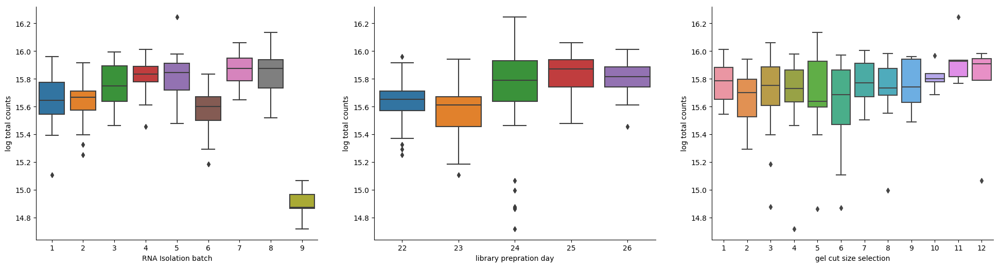

<Figure size 600x400 with 0 Axes>

<Figure size 600x400 with 0 Axes>

<Figure size 600x400 with 0 Axes>

In [474]:
fig, ax = plt.subplots(1,3,figsize=(24, 6))
for  i in range(3):
    show_batch_total_counts(ax[i],batchtable, original_mx, batchindex = i)
plt.tight_layout()

### PCA batch with other normal dataset

In [475]:
def show_batch_sns(data,sampleclass,batchinfo,batch_ind=0):
    X = np.log2(data + 0.001).T
    X = StandardScaler().fit_transform(X)
    method = 'UMAP'
    if method == 'PCA':
        transform = PCA()
    elif method == 'tSNE':
        transform = TSNE()
    elif method == 'UMAP':
        transform = umap.UMAP(n_neighbors=5,min_dist=0.3,metric='correlation')

    X_pca = transform.fit_transform(X)
    plot_table = pd.DataFrame(X_pca[:,:2])
    plot_table.index = data.columns
    plot_table = pd.concat((plot_table,sampleclass.loc[plot_table.index]),axis=1)
    plot_table.columns = ['dimension_1','dimension_2','class']
    plot_table = pd.concat((plot_table,batchinfo.loc[plot_table.index]),axis=1)
    #display(plot_table)
    batchnum = np.unique(plot_table.iloc[:,3+batch_ind]).shape[0]
    
    fig, ax = plt.subplots(1,figsize=(5, 5))
    sns.scatterplot(ax=ax,data=plot_table,x="dimension_1", y="dimension_2",style="class",
                    palette=list(np.array(Category20c[20]).reshape(4,-1).T.ravel())[:batchnum],
                    #palette=np.array(Category20c[20])[np.arange(0,20,3)],
                    hue=plot_table.columns[3+batch_ind],s=50,alpha=0.7)
    legend = ax.legend(prop=fontlegend,
                      #labelspacing=labelspacing,borderpad=borderpad,handletextpad=handletextpad,
                      edgecolor="#000000",fancybox=False)#,markerscale=markerscale)
    ax.legend_.get_frame()._linewidth=0.5
    legend.get_title().set_fontweight('normal')
    legend.get_title().set_fontsize(6.5)
    std_plot(ax,'Dimension 1','Dimension 2')

In [476]:
exosome_small_mx.shape

(5664, 206)

In [477]:
deleteclassindd = np.concatenate((np.where((exosome_small_class.label=='Pancreatic Cancer'))[0],np.where(exosome_small_class.label=='Prostate Cancer')[0]))


In [478]:
exosome_small_mx = pd.read_table('output/exosome_small/count_matrix/domains_combined.txt',index_col=0)
exosome_small_batch = pd.read_table('data/exosome_small/batch_info.txt',index_col=0)
exosome_small_class = pd.read_table('data/exosome_small/sample_classes.txt',index_col=0)

show_batch_sns(exosome_small_mx,exosome_small_class,exosome_small_batch)
embed_pdf_figure()

exosome_small_mx = pd.read_table('output/exosome_small/matrix_processing/filter.viper_count.Norm_RLE.Batch_Combat_1.domains_combined.txt',index_col=0)
exosome_small_batch = pd.read_table('data/exosome_small/batch_info.txt',index_col=0)
exosome_small_class = pd.read_table('data/exosome_small/sample_classes.txt',index_col=0)

show_batch_sns(exosome_small_mx,exosome_small_class,exosome_small_batch)
embed_pdf_figure()

In [479]:
exosome_small_mx.shape

(5664, 206)

In [480]:
deleteclassindd

array([ 88, 112, 137, 162, 187, 188,  64,  65,  66,  67,  68,  69,  70,
        71,  89,  90,  91,  92,  93,  94,  95, 113, 114, 115, 116, 117,
       118, 119, 138, 139, 140, 141, 142, 143, 163, 164, 165, 166, 167,
       189, 190, 191])

In [481]:
exosome_small_mx = pd.read_table('output/exosome_small/count_matrix/domains_combined.txt',index_col=0)
exosome_small_batch = pd.read_table('data/exosome_small/batch_info.txt',index_col=0)
exosome_small_class = pd.read_table('data/exosome_small/sample_classes.txt',index_col=0)

show_batch_sns(np.delete(exosome_small_mx,deleteclassindd,axis=1),exosome_small_class,exosome_small_batch)
embed_pdf_figure()

exosome_small_mx = pd.read_table('output/exosome_small/matrix_processing/filter.viper_count.Norm_RLE.Batch_Combat_1.domains_combined.txt',index_col=0)
exosome_small_batch = pd.read_table('data/exosome_small/batch_info.txt',index_col=0)
exosome_small_class = pd.read_table('data/exosome_small/sample_classes.txt',index_col=0)

show_batch_sns(exosome_small_mx,exosome_small_class,exosome_small_batch)
embed_pdf_figure()

ValueError: Shape of passed values is (164, 5812), indices imply (206, 5812)

In [482]:
show_batch_sns(original_mx,sample_class,batchtable)
embed_pdf_figure()

### RNA batch by batch

In [412]:
def plot_rna_batch(ax,rnaname,typetable,batchtable,batchindex=1):
    '''
    typetable: table_ratio
    rnaname certain type pf rna
    '''
    counts = typetable.T.loc[rnaname].T
    sumtable = pd.DataFrame(counts)
    sumtable_whole = pd.concat((sumtable.loc[batchtable.index],batchtable),axis=1)
    batchname = batchtable.columns[batchindex]
    sns.boxplot(data=sumtable_whole,x=batchname,y=rnaname,ax=ax)
    ax.set_title('batch effect: '+batchname+ ' by '+rnaname,size=16)
    plt.tight_layout()
fig, ax = plt.subplots(4,3,figsize=(30, 24))
for i in range(4):
    for j in range(3):
        plot_rna_batch(ax[i,j],rnanames[i],table_ratio,batchtable,batchindex=j)

### RLE batch

In [413]:
def plotRLE(mat,batch,log=False,batchindex=1):
    if log is not True:
        log_mat = np.log2(mat+1)
    else:
        log_mat = mat
    feature_meds = log_mat.apply(np.median,1).tolist()
    for i in np.arange(len(feature_meds)):
        log_mat.iloc[i] = log_mat.iloc[i] - feature_meds[i]
    mat_rle = log_mat
    stack = pd.DataFrame(mat_rle.stack())
    stack = stack.reset_index()
    stack.rename(columns={stack.columns[2]: "counts",
                          stack.columns[1]: "sample"},
                 inplace=True)
    stack['class'] = None
    if batch is not None:
        for samplename in np.unique(stack['sample']):
            stack['class'].iloc[np.where(stack['sample'] == samplename)] \
            = batch[batch.index==samplename].iloc[0,batchindex]

        fig,ax = plt.subplots(figsize=(7,7))
        ax = sns.boxplot(x='class',y='counts',data=stack,fliersize=0.1,linewidth=0.5)
        std_plot(ax,batch.columns[batchindex],'RLE')
    else:
        fig,ax = plt.subplots(figsize=(7,3.5))
        ax = sns.boxplot(x='sample',y='counts',data=stack,fliersize=0,linewidth=0.5)
        std_plot(ax,'sample','RLE')
    embed_pdf_figure()


plotRLE(batch_table,batchtable,batchindex=1)

### PCA batch

In [414]:
rnatype_list = unique([name.split('|')[1] for name in original_mx.index])

def get_mx_RNA_spec(table,rnatype):
    name_filter = np.where(array([name.split('|')[1] for name in table.index]) == rnatype)
    return table.iloc[name_filter]
merge = pd.DataFrame()
for rnatype in tqdm(rnatype_list):
    original_mx_rna = get_mx_RNA_spec(original_mx,rnatype)
    impute_table_rna = get_mx_RNA_spec(impute_table,rnatype)
    normalize_table_rna = get_mx_RNA_spec(normalize_table,rnatype)
    batch_table_rna = get_mx_RNA_spec(batch_table,rnatype)
    fig,ucalist = visualize_effect_all(original_mx_rna, impute_table_rna, normalize_table_rna, batch_table_rna, sample_class,method='UMAP')
    ucalist.rename(columns={ ucalist.columns[0]: rnatype }, inplace=True)
    merge = pd.concat([merge,ucalist],axis=1)
    fig.savefig(savepath+rnatype+'_batch.eps')
    embed_pdf_figure(title=rnatype)
    
uca_rna_mx = merge
uca_rna_mx = uca_rna_mx.T.sort_values(by='Original matrix', ascending=False).T
uca_rna_mx.columns.name = 'rnatype'
uca_rna_stack = pd.DataFrame(uca_rna_mx.stack())
uca_rna_stack = uca_rna_stack.reset_index()
uca_rna_stack.rename(columns={ uca_rna_stack.columns[2]: "uca_score" }, inplace=True)
uca_rna_stack.rename(columns={ uca_rna_stack.columns[0]: "process" }, inplace=True)


HBox(children=(IntProgress(value=0, max=11), HTML(value='')))

In [415]:
fig,ax=plt.subplots(figsize=(7,4))
ax = sns.barplot(x="rnatype", y="uca_score", hue="process", data=uca_rna_stack)
ax.set_xticklabels(ax.get_xticklabels(),rotation=45,horizontalalignment='right')
std_plot(ax,'RNA types','UCA scores',legendtitle='Processes',legendsort=False,borderpad=0.2,labelspacing=0.2)
fig.savefig(savepath+'UCAscores_of_RNA_batch_bar.eps')
fig.tight_layout()
embed_pdf_figure()

### feature batch by batch box

In [416]:
def featureplot_total_batch(ax,stack_batch,batchtable,batchindex=1):
    sns.boxplot(ax=ax,data=stack_batch,x=batchtable.columns[batchindex],y='counts',color='grey',linewidth=1,fliersize=0.1)
    std_plot(ax,batchtable.columns[batchindex],'feature counts')#,title='batch effect: '+batchtable.columns[batchindex]+ ' by '+'feature counts'
    
def stack_merge(exp_table,batch,log=False):
    if log is False:
        exp_table = np.log2(exp_table+1)
    stack = pd.DataFrame(exp_table.stack())
    stack = stack.reset_index()
    stack['rnaname'] = [featurename.split('|')[1] for featurename in stack.iloc[:,0].tolist()]
    stack.rename(columns={stack.columns[2]: "counts",
                          stack.columns[1]: "sample",
                          stack.columns[0]: "feature"},
                 inplace=True)
    stack = stack.set_index('sample')
    stack_batch = pd.concat([stack,batchtable],axis=1,join_axes=[stack.index])
    stack_batch = stack_batch.reset_index()    
    return(stack_batch)

stack_batch = stack_merge(batch_table,batchtable)
fig, ax = plt.subplots(1,3,figsize=(7, 2))
for i in arange(3):
    featureplot_total_batch(ax[i],stack_batch,batchtable,batchindex=i)
plt.tight_layout()
embed_pdf_figure()

In [417]:
def featureplot_rna_batch(ax,rnano,stack_batch,batchtable,batchindex=1):
    rnaname = unique(stack_batch['rnaname'])
    stack_batch_rna = stack_batch[stack_batch['rnaname']==rnaname[rnano]]
    sns.boxplot(ax=ax,data=stack_batch_rna,x=batchtable.columns[batchindex],y='counts',color='grey',linewidth=1,fliersize=0.1)
    std_plot(ax,batchtable.columns[batchindex],rnaname[rnano],title='batch effect: '+batchtable.columns[batchindex]+ ' by '+rnaname[rnano])

stack_batch = stack_merge(batch_table,batchtable)
fig, ax = plt.subplots(4,3,figsize=(7, 5.5))
for i in arange(4):
    for j in arange(3):
        featureplot_rna_batch(ax[i,j],i,stack_batch,batchtable,batchindex=j)
#featureplot_rna_batch(ax[0,0],rnanames[2],stack_batch,batchtable,batchindex=2)
#featureplot_rna_batch(ax[0,1],rnanames[2],stack_batch,batchtable,batchindex=2)
#featureplot_rna_batch(ax[1,1],rnanames[2],stack_batch,batchtable,batchindex=2)
plt.tight_layout()
embed_pdf_figure()

# Evaluation

In [9]:
def summarize_feature_selection(output_dir):
    metrics = []
    features = []
    pbar = tqdm(unit='directory')
    dirstack = []
    for count_method in os.listdir(os.path.join(output_dir, 'select_preprocess_method', 'uca_score')):
        preprocess_method = open(os.path.join(output_dir, 'select_preprocess_method', 'uca_score', count_method, 'selected_methods.txt')).readline().strip()
        dirstack.append(os.path.join(output_dir, 'cross_validation', preprocess_method + '.' + count_method))
        for compare_group in os.listdir(dirstack[-1]):
            dirstack.append(os.path.join(dirstack[-1], compare_group))
            for feature_selection_method in os.listdir(dirstack[-1]):
                classifier, n_select, select_method, fold_change_direction  = feature_selection_method.split('.')
                metadata = {
                    'compare_group': compare_group,
                    'classifier': classifier,
                    'n_features': n_select,
                    'fold_change_direction': fold_change_direction,
                    'preprocess_method': preprocess_method,
                    'count_method': count_method
                }
                try:
                    df = pd.read_table(os.path.join(dirstack[-1], feature_selection_method, 'metrics.test.txt'), sep='\t')
                except IOError:
                    continue
                df_metadata = pd.DataFrame(index=np.arange(df.shape[0]))
                for key, val in metadata.items():
                    df_metadata[key] = val
                metrics.append(pd.concat([df_metadata, df], axis=1))
                pbar.update(1)
            dirstack.pop()
        dirstack.pop()
    metrics = pd.concat(metrics, axis=0)
    return metrics

metrics = summarize_feature_selection('output/'+dataset)

#newdf = df[(df['fold_change_direction']==value_change)&(df['classifier']==classifier_use)]
newdf=metrics
newdf.index = newdf.compare_group
newdf['preprocess_methods'] = np.array([newdf.preprocess_method[i]+'.'+newdf.count_method[i] for i in range(newdf.shape[0])])
tmpdict = {}
for i in np.unique(newdf.index):
    tmpdict[i] = np.unique(newdf.loc[i].preprocess_methods)

HBox(children=(IntProgress(value=1, bar_style='info', max=1), HTML(value='')))

In [10]:
def interactive_config_settings(dataset,sequencing_type,classifier,value_change,example_cancer,reads_preprocess,stage_info):
    if sequencing_type == 'short':
        exp_mx_name = 'domains_combined'
    elif sequencing_type =='long':
        exp_mx_name = 'featurecounts'
    elif sequencing_type =='domain_only':
        exp_mx_name = 'domains_long'
    elif sequencing_type =='transcript':
        exp_mx_name = 'transcript'
    elif sequencing_type =='transcript_small':
        exp_mx_name = 'transcript_small'
    elif sequencing_type =='transcript_long_bg':
        exp_mx_name = 'transcript_long_bg'
    return dataset,sequencing_type,classifier,value_change,exp_mx_name,example_cancer,reads_preprocess,stage_info

widget =interactive(interactive_config_settings,
           dataset= ['scirep','exorbase','exosome_small','pico_3v3'],
           sequencing_type=['short','long','domain_only','transcript'],
           classifier = ['random_forest','logistic_regression','linear_svm','decision_tree','logistic_regression_l1'],
           value_change = ['any','up','down'],
        example_cancer=['Normal-CRC','Normal-PAAD','Normal-PRAD','Normal-HCC'],
                   reads_preprocess=[True,False],
                   stage_info = ['No Stage','With Stage'])  # if start from preprocessing
display(widget)


interactive(children=(Dropdown(description='dataset', options=('scirep', 'exorbase', 'exosome_small', 'pico_3v3'), value='scirep'), Dropdown(description='sequencing_type', options=('short', 'long', 'domain_only', 'transcript'), value='short'), Dropdown(description='classifier', options=('random_forest', 'logistic_regression', 'linear_svm', 'decision_tree', 'logistic_regression_l1'), value='random_forest'), Dropdown(description='value_change', options=('any', 'up', 'down'), value='any'), Dropdown(description='example_cancer', options=('Normal-CRC', 'Normal-PAAD', 'Normal-PRAD', 'Normal-HCC'), value='Normal-CRC'), Dropdown(description='reads_preprocess', options=(True, False), value=True), Dropdown(description='stage_info', options=('No Stage', 'With Stage'), value='No Stage'), Output()), _dom_classes=('widget-interact',))

In [11]:
dataset,sequencing_type,classifier_use,value_change,exp_mx_name,example_cancer,reads_preprocess,stage_info = widget.result
dataset,sequencing_type,classifier_use,value_change,exp_mx_name,example_cancer,reads_preprocess,stage_info

('scirep',
 'short',
 'random_forest',
 'any',
 'domains_combined',
 'Normal-CRC',
 True,
 'No Stage')

In [12]:
file_counts = 'output/'+dataset+'/summary/read_counts.txt'
file_length_path = 'output/'+dataset+'/stats/mapped_read_length_by_sample/'
file_length_path_insert = 'output/'+dataset+'/stats/mapped_insert_size_by_sample/'
plot_save_path = 'output/'+dataset+'/plots/'

    
import datetime
now = datetime.datetime.now()
timenow = '{}.{}.{}.{}:{}'.format(now.year,now.month,now.day,now.hour,now.minute)
savepath = 'output/candidate/'+dataset+'/'+dataset+'.'+sequencing_type+'.'+classifier_use+'.'+value_change+'.'+timenow+'/'
save_path = 'output/candidate/'+dataset+'/'+dataset+'.'+sequencing_type+'.'+classifier_use+'.'+value_change+'.'+timenow+'/'

if not os.path.exists(savepath):
    os.mkdir(savepath)

In [13]:
if dataset=='scirep':
    if stage_info =='No Stage':
        class_info = 'data/'+dataset+'/sample_classes.no_stage.txt'
    else:
        class_info = 'data/'+dataset+'/sample_classes.txt'

## feature recurrence

In [14]:
cpm_table_origin_ = pd.read_table('output/'+dataset+'/matrix_processing/filter.'+exp_mx_name+'.txt')
cpm_table_origin =  cpm_table_origin_/cpm_table_origin_.sum(axis=0)*10e6
length_tmp = np.array([cpm_table_origin.index[i].split('|')[-1] for i in range(cpm_table_origin.index.shape[0])]).astype('int')-\
np.array([cpm_table_origin.index[i].split('|')[-2] for i in range(cpm_table_origin.index.shape[0])]).astype('int')
rpkm_table_origin = (cpm_table_origin_.T/length_tmp*1000).T


def calculate_fc(table,original_index,sample_class, class_compare,cpm_table_origin):
    samples_use = np.array(sample_class.index)[np.isin(sample_class.label,class_compare)]
    sample_class_use = sample_class.iloc[np.isin(sample_class.label,class_compare)]
    sample_class_1_use = sample_class_use.iloc[np.where(sample_class_use.label ==class_compare[0])]
    sample_class_2_use = sample_class_use.iloc[np.where(sample_class_use.label ==class_compare[1])]
    table_selected = table.loc[original_index]
    length = np.array([original_index[i].split('|')[-1] for i in range(original_index.shape[0])]).astype('int')-\
np.array([original_index[i].split('|')[-2] for i in range(original_index.shape[0])]).astype('int')
    #print (length)
    rpkmtable = (table_selected.T/length).T*1000
    #display(rpkmtable)
    #display(table_selected)
    rpkmtable_ = pd.concat((rpkmtable.loc[original_index,sample_class_1_use.index],
               rpkmtable.loc[original_index,sample_class_2_use.index]),axis=1)
    cpmtable_ = pd.concat((cpm_table_origin.loc[original_index,sample_class_1_use.index],
               cpm_table_origin.loc[original_index,sample_class_2_use.index]),axis=1)
    return np.mean(np.log2(rpkmtable.loc[:,sample_class_1_use.index]+0.01),axis=1) -\
np.mean(np.log2(rpkmtable.loc[:,sample_class_2_use.index]+0.01),axis=1),rpkmtable_,cpmtable_
def compare_features(path,sample_class,class_compare,compare_group,savepath=savepath,save_table=True):
    pbar = tqdm(unit='directory')
    feature_lists = {}
    for feature_selection_method in os.listdir(path):
        classifier, n_features, select_method,value_changes  = feature_selection_method.split('.')
        if classifier==classifier_use:
            n_features = int(n_features)
            if n_features > 10:
                continue
            # feature importance
            if value_changes == value_change:
                feature_lists[n_features] = pd.read_table(os.path.join(path,
                    feature_selection_method, 'feature_importances.txt'), header=None, index_col=0).iloc[:, 0]
                feature_lists[n_features].index = feature_lists[n_features].index.astype('str')
                pbar.update(1)
    # feature union set
    feature_set = reduce(np.union1d, [a.index.values for a in feature_lists.values()])
    # build feature importance matrix
    feature_matrix = pd.DataFrame(np.zeros((len(feature_set), len(feature_lists))),
                                  index=feature_set, columns=list(feature_lists.keys()))
    #print (feature_matrix.shape)
    for n_features, feature_importance in feature_lists.items():
        feature_matrix.loc[feature_importance.index.values, n_features] = feature_importance.values
    feature_matrix.columns = feature_matrix.columns.astype('int')
    feature_matrix.index = feature_matrix.index.astype('str')
    
    feature_matrix = feature_matrix.loc[:, feature_matrix.columns.sort_values().values]
    original_index = feature_matrix.index
    feature_info = feature_matrix.index.to_series().str.split('|', expand=True)
    feature_info.columns = ['gene_id', 'gene_type', 'gene_name', 'feature_id', 'transcript_id', 'start', 'end']

    feature_matrix.index = feature_info.loc[:, 'gene_name'].values \
        + '|' + feature_info.loc[:, 'gene_type'].values \
        + '|' + feature_info.loc[:, 'gene_id'].values \
    
    # build feature indicator matrix
    feature_indicator_matrix = pd.DataFrame(np.zeros((len(feature_set), len(feature_lists))),
                                  index=feature_set, columns=list(feature_lists.keys()))
    for n_features, feature_importance in feature_lists.items():
        feature_indicator_matrix.loc[feature_importance.index.values, n_features] = 1
    feature_indicator_matrix.columns = feature_indicator_matrix.columns.astype('int')
    feature_indicator_matrix = feature_indicator_matrix.loc[:, feature_indicator_matrix.columns.sort_values().values]
    
    feature_indicator_matrix.index = feature_info.loc[:, 'gene_name'].values \
        + '|' + feature_info.loc[:, 'gene_type'].values \
        + '|' + feature_info.loc[:, 'gene_id'].values
    #fig, ax = plt.subplots(figsize=(6, 8))
    #sns.heatmap(feature_indicator_matrix,
    #            cmap=sns.light_palette('green', as_cmap=True), cbar=False, ax=ax, linewidth=1)
    #ax.set_xlabel('Number of features')
    #ax.set_ylabel('Features')
    #display(processed_matrix)
    foldchange,rpkmtable,cpmtable = calculate_fc(processed_matrix, original_index,sample_class,class_compare,cpm_table_origin)
    foldchange.index = feature_matrix.index
    feature_matrix = pd.concat((feature_matrix,foldchange),axis=1)
    #display(feature_matrix) 
    if feature_matrix.shape[1]==2:
        feature_matrix.columns = np.concatenate((np.array([10]).astype('str'),np.array(['fold change'])))
    else:
        feature_matrix.columns = np.concatenate((np.arange(1,11).astype('str'),np.array(['fold change'])))
    #display (feature_matrix)
    feature_matrix.index = feature_info.loc[:, 'gene_name'].values \
        + '|' + feature_info.loc[:, 'gene_type'].values \
    + '|' + feature_info.loc[:, 'feature_id'].values \
        + '|' + feature_info.loc[:, 'transcript_id'].values
    #display (feature_matrix)
    display(feature_matrix.style\
        .background_gradient(cmap=sns.light_palette('green', as_cmap=True))\
        .set_precision(2)\
        .set_caption(path))
    pbar.close()
    if save_table:
        feature_matrix.to_csv(savepath+compare_group+'_feature_table.txt',sep='\t')
    return feature_matrix,feature_indicator_matrix,original_index,foldchange,rpkmtable,cpmtable

In [15]:
def scale(axis,table):
    '''
    axis: 0(by sample)/1(by feature)/2(both 0 and 1)
    '''
    scaler = StandardScaler()
    arr = np.array(table)
    if axis==0:
        return scaler.fit_transform(arr)
    elif axis==1:
        return scaler.fit_transform(arr.T).T
    elif axis==2:
        return scaler.fit_transform(scaler.fit_transform(arr).T).T
def clustermap(processed_matrix,featurename,sample_class, class_compare,compare_group,savepath=savepath,savefig=True,plot=False):
    samples_use = np.array(sample_class.index)[np.isin(sample_class.label,class_compare)]
    #samples_use = np.loadtxt(output_feature_selection_path+'{}/{}'.format(preprocess_method,compare_group)+)
    #display(sample_class.loc[samples_use])
    sample_class_use = sample_class.loc[samples_use].iloc[np.isin(sample_class.loc[samples_use].label,class_compare)]
    cpm_table = processed_matrix
    cpm_table_use = cpm_table.loc[featurename,samples_use]
    #display(cpm_table_use)
    cpm_matrix= np.log2(np.array(cpm_table_use)+0.01)
    cpm_table_use.iloc[:,:] = RobustScaler().fit_transform(cpm_matrix.T).T
    rgblabel = np.repeat('r',samples_use.shape[0])
    rgblabel[np.where(sample_class_use.label==class_compare[-1])] = 'b'
    cpm_table_use.index = np.array([cpm_table_use.index[i].split('|')[2]+'|'+cpm_table_use.index[i].split('|')[1] for i in range(cpm_table_use.index.shape[0]) ])
    if plot:
        sns_plot = sns.clustermap(cpm_table_use,cmap='vlag',figsize=(70,20),col_colors=rgblabel)
        if savefig:
            sns_plot.savefig(savepath+compare_group+'_clustermap.eps', bbox_inches='tight')
    return cpm_table_use,sample_class_use


HBox(children=(IntProgress(value=0, max=7), HTML(value='')))

Normal-CRC filter.viper_count.Norm_TMM.Batch_RUV.domains_combined


HBox(children=(IntProgress(value=1, bar_style='info', max=1), HTML(value='')))

,10,fold change
hsa-miR-100-5p|miRNA|hsa-miR-100-5p|hsa-miR-100-5p,0.09,-0.053
hsa-miR-1343-3p|miRNA|hsa-miR-1343-3p|hsa-miR-1343-3p,0.13,-0.32
21355|tRNA|peak_111|21355,0.044,0.085
30984|tRNA|peak_320|30984,0.11,0.29
Y_RNA|Y_RNA|peak_537|ENST00000362602.1,0.065,0.22
SNORD26|snoRNA|peak_721|ENST00000384147.1,0.22,-1.1
AC006548.3|lncRNA|peak_1545|ENST00000623130.1,0.076,-0.55
chr11_8044980_8045020_+|genomic|peak_2301|chr11,0.1,-0.41
chr19_36139780_36139820_-|genomic|peak_3364|chr19,0.041,-0.36
chr3_1073160_1073180_-|genomic|peak_3942|chr3,0.11,-0.22


Normal-CRC_S1 filter.viper_count.Norm_TMM.Batch_RUV.domains_combined


HBox(children=(IntProgress(value=1, bar_style='info', max=1), HTML(value='')))

,10,fold change
RNU5B-2P|snRNA|peak_561|ENST00000363036.1,0.056,-0.6
BCL10|mRNA|peak_1524|ENST00000620248.1,0.077,-0.59
G059717|tucpRNA|peak_1763|T259518,0.11,0.44
chr1_29665820_29665860_+|genomic|peak_1877|chr1,0.098,-0.4
chr12_40508300_40508340_-|genomic|peak_2510|chr12,0.03,-0.14
chr17_66755840_66755880_+|genomic|peak_3193|chr17,0.24,-0.93
chr2_58429460_58429500_-|genomic|peak_3487|chr2,0.023,-0.05
chr3_1073160_1073180_-|genomic|peak_3942|chr3,0.079,-0.52
chr3_150620140_150620180_+|genomic|peak_4113|chr3,0.099,0.38
chrX_130264180_130264220_+|genomic|peak_5412|chrX,0.19,0.37


Normal-CRC_S2 filter.viper_count.Norm_TMM.Batch_RUV.domains_combined


HBox(children=(IntProgress(value=1, bar_style='info', max=1), HTML(value='')))

,10,fold change
30984|tRNA|peak_320|30984,0.076,0.33
Y_RNA|Y_RNA|peak_577|ENST00000363421.1,0.064,0.03
U1|snRNA|peak_1479|ENST00000610976.1,0.11,-0.069
XKR5|mRNA|peak_1513|ENST00000618742.2,0.13,-0.23
G035943|tucpRNA|peak_1715|T155630,0.045,-0.027
chr1_26046440_26046480_+|genomic|peak_1869|chr1,0.1,-0.024
chr1_217791440_217791460_-|genomic|peak_2097|chr1,0.11,-0.22
chr15_89335100_89335160_+|genomic|peak_2924|chr15,0.16,-0.044
chr2_11761980_11762020_-|genomic|peak_3426|chr2,0.14,-0.044
chr3_60898180_60898220_-|genomic|peak_4017|chr3,0.054,-0.053


Normal-CRC_S3 filter.viper_count.Norm_TMM.Batch_RUV.domains_combined


HBox(children=(IntProgress(value=1, bar_style='info', max=1), HTML(value='')))

,10,fold change
hsa-miR-128-3p|miRNA|hsa-miR-128-3p|hsa-miR-128-3p,0.1,-0.15
hsa-miR-138-1-3p|miRNA|hsa-miR-138-1-3p|hsa-miR-138-1-3p,0.067,-0.042
22782|tRNA|peak_144|22782,0.11,-0.21
30984|tRNA|peak_320|30984,0.072,0.33
34161|tRNA|peak_356|34161,0.082,-0.12
34168|tRNA|peak_363|34168,0.026,-0.11
SNORD26|snoRNA|peak_721|ENST00000384147.1,0.22,-0.88
DLEC1|mRNA|peak_1036|ENST00000478428.1,0.11,0.29
chr12_7581300_7581340_-|genomic|peak_2478|chr12,0.072,-0.074
chr7_139340720_139340780_+|genomic|peak_4943|chr7,0.15,0.054


Normal-CRC_S4 filter.viper_count.Norm_TMM.Batch_RUV.domains_combined


HBox(children=(IntProgress(value=1, bar_style='info', max=1), HTML(value='')))

,10,fold change
hsa-miR-20a-5p|miRNA|hsa-miR-20a-5p|hsa-miR-20a-5p,0.14,-0.019
21322|tRNA|peak_87|21322,0.097,0.16
36075|tRNA|peak_396|36075,0.093,0.21
RNU11|snRNA|peak_763|ENST00000387069.1,0.1,-0.085
chr12_96036040_96036100_+|genomic|peak_2555|chr12,0.07,-0.2
chr13_79263360_79263400_+|genomic|peak_2673|chr13,0.045,-0.29
chr14_73863080_73863120_-|genomic|peak_2785|chr14,0.22,0.19
chr17_66755840_66755880_+|genomic|peak_3193|chr17,0.14,-0.93
chr4_134294100_134294140_+|genomic|peak_4305|chr4,0.022,-0.018
chr6_27583440_27583500_-|genomic|peak_4627|chr6,0.079,-0.17


Normal-PAAD filter.viper_count.Norm_TMM.Batch_RUV.domains_combined


HBox(children=(IntProgress(value=1, bar_style='info', max=1), HTML(value='')))

,10,fold change
hsa-miR-30e-3p|miRNA|hsa-miR-30e-3p|hsa-miR-30e-3p,0,-0.2
28612|tRNA|peak_250|28612,0.17,0.18
30977|tRNA|peak_315|30977,0.2,-0.024
35974|tRNA|peak_386|35974,0.087,0.025
chr1_73806940_73807000_-|genomic|peak_1921|chr1,0.018,-0.17
chr1_204562400_204562440_-|genomic|peak_2083|chr1,0.18,-0.34
chr11_92085380_92085440_-|genomic|peak_2410|chr11,0,-0.2
chr11_109521840_109521880_+|genomic|peak_2425|chr11,0,0.1
chr11_109603180_109603240_+|genomic|peak_2426|chr11,0.13,-0.11
chr5_153834120_153834160_+|genomic|peak_4523|chr5,0.21,-0.0075


Normal-PRAD filter.viper_count.Norm_TMM.Batch_RUV.domains_combined


HBox(children=(IntProgress(value=1, bar_style='info', max=1), HTML(value='')))

,10,fold change
hsa-miR-130a-3p|miRNA|hsa-miR-130a-3p|hsa-miR-130a-3p,0.038,0.29
hsa_piR_019420|piRNA|hsa_piR_019420|hsa_piR_019420,0.067,0.16
Y_RNA|Y_RNA|peak_576|ENST00000363391.1,0.03,0.22
RNU1-34P|snRNA|peak_615|ENST00000364421.1,0.043,0.068
RNU1-28P|snRNA|peak_707|ENST00000383861.1,0.073,0.017
Y_RNA|Y_RNA|peak_724|ENST00000384184.1,0.011,0.27
Y_RNA|Y_RNA|peak_727|ENST00000384223.1,0.1,0.23
RNU1-4|snRNA|peak_756|ENST00000384659.1,0.04,0.034
AC006548.3|lncRNA|peak_1545|ENST00000623130.1,0.36,-1.6
chr16_985540_985580_-|genomic|peak_2953|chr16,0.23,0.029


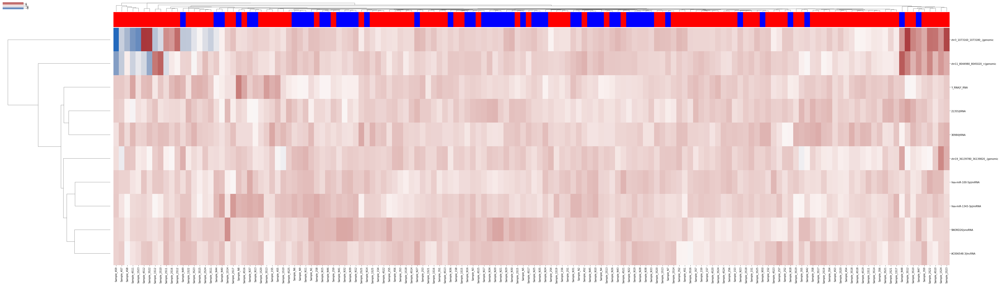

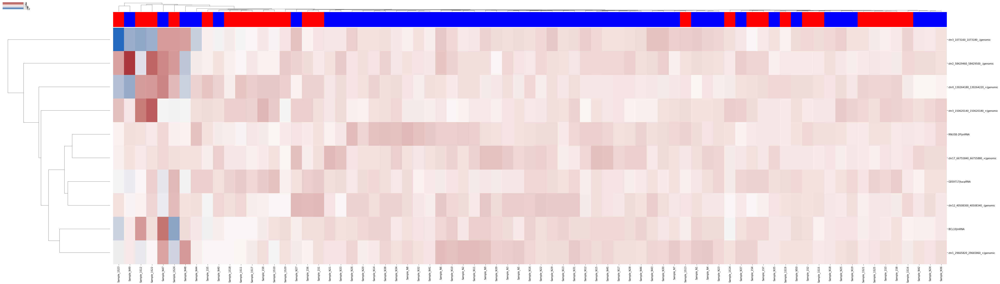

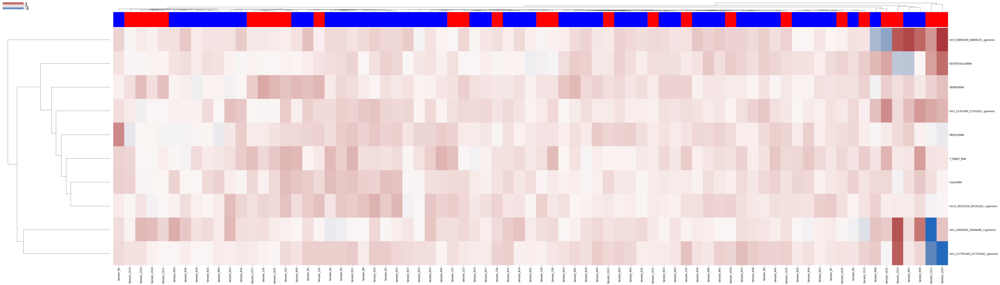

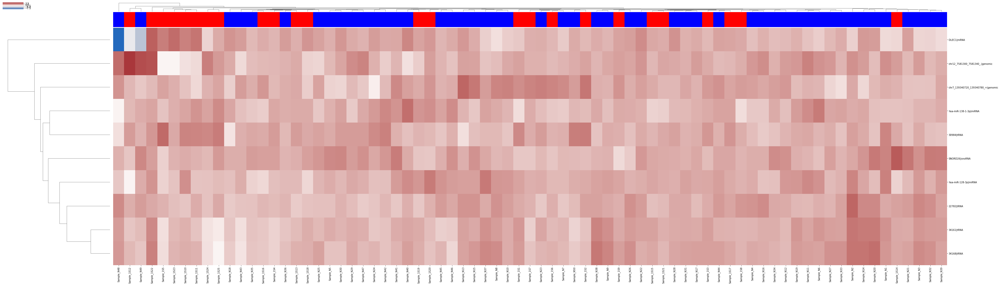

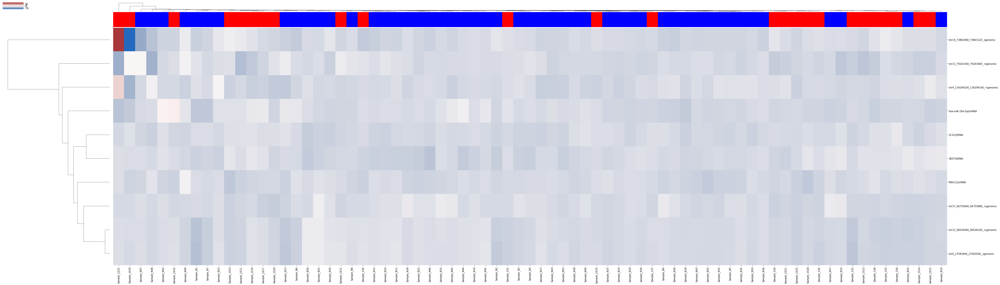

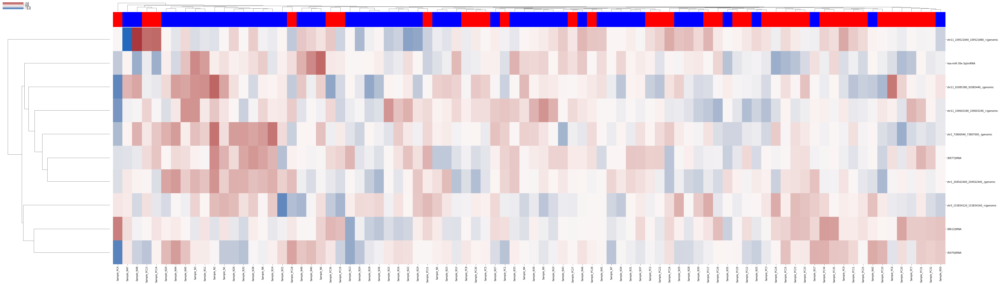

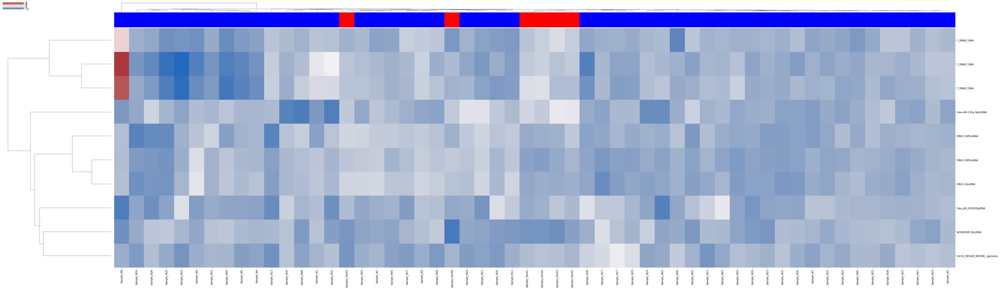

In [16]:
output_feature_selection_path = 'output/'+dataset+'/cross_validation/'
feature_matrix,feature_indicator_matrix,original_index,foldchange,rpkmtable,cpm_table_use,sample_class_use,cpmtable = {},{},{},{},{},{},{},{}
for compare_group, preprocess_method in tqdm(tmpdict.items()):
    preprocess_method = preprocess_method[np.where(np.array([preprocess_method[i].split('.')[-1] for i in range(preprocess_method.shape[0])])==exp_mx_name)][0]
                   
    print (compare_group,preprocess_method)
    #compare_group = compare_group[0]            
    class_info = 'data/'+dataset+'/sample_classes.txt'
    if dataset =='scirep':
        if compare_group=='Normal-CRC':
            class_compare = np.array(['Colorectal Cancer', 'Healthy Control'])
            class_info = 'data/'+dataset+'/sample_classes.no_stage.txt'
        elif compare_group=='Normal-PAAD':
            class_compare = np.array(['Prostate Cancer', 'Healthy Control']) 
            class_info = 'data/'+dataset+'/sample_classes.no_stage.txt'
        elif compare_group=='Normal-PRAD':
            class_compare = np.array(['Pancreatic Cancer', 'Healthy Control']) 
            class_info = 'data/'+dataset+'/sample_classes.no_stage.txt'
        elif compare_group=='Normal-CRC_S1':
            class_compare = np.array([ 'Colorectal Cancer Stage 1', 'Healthy Control'])
        elif compare_group=='Normal-CRC_S1':
            class_compare = np.array([ 'Colorectal Cancer Stage 1', 'Healthy Control'])
        elif compare_group=='Normal-CRC_S1':
            class_compare = np.array([ 'Colorectal Cancer Stage 1', 'Healthy Control'])
        elif compare_group=='Normal-CRC_S1':
            class_compare = np.array([ 'Colorectal Cancer Stage 1', 'Healthy Control'])
    elif dataset =='lulab_hcc':
        if compare_group=='Normal-HCC':
            class_info = 'data_old/labels/sample_classes_hcc.txt'
            class_compare = np.array(['HCC', 'Normal']) 
        elif compare_group=='Normal-stage_A':
            class_compare = np.array(['stage_A', 'Normal']) 
    elif dataset =='exorbase':
        if compare_group=='Normal-HCC':
            class_compare = np.array(['HCC', 'Healthy']) 
        elif compare_group=='Normal-CRC':
            class_compare = np.array(['CRC', 'Healthy']) 
        elif compare_group=='Normal-PAAD':
            class_compare = np.array(['PAAD', 'Healthy']) 
    sample_class = pd.read_table(class_info,sep='\t',index_col=0)
    processed_matrix = pd.read_table('output/'+dataset+'/matrix_processing/'+preprocess_method+'.txt',sep='\t',index_col=0)
    feature_matrix[compare_group],feature_indicator_matrix[compare_group],\
    original_index[compare_group],foldchange[compare_group],rpkmtable[compare_group],cpmtable[compare_group] = compare_features(output_feature_selection_path+'{}/{}'.format(preprocess_method,compare_group),sample_class,class_compare,compare_group)
    features =  feature_matrix[compare_group].index
    cpm_table_use[compare_group],sample_class_use[compare_group] =  clustermap(processed_matrix,original_index[compare_group],sample_class,class_compare,compare_group,plot=1)
    

## bar plot of feature importance

In [17]:
filtered_mx = pd.read_table('output/'+dataset+'/matrix_processing/filter.'+exp_mx_name+'.txt')
filtered_mx.index =  np.array([filtered_mx.index[i].split('|')[2]+'|'+filtered_mx.index[i].split('|')[1]+'|'+filtered_mx.index[i].split('|')[3]+'|'+filtered_mx.index[i].split('|')[4] for i in range(filtered_mx.index.shape[0])])


In [35]:
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
viridisBig = cm.get_cmap('BuGn', 512)
newcmp = ListedColormap(viridisBig(np.linspace(0.25, 1, 256)))

def weight_bar_plt(weight=None,recurrence=None,rpkm=None,de=None,area_=(6.0,8.0),nameshort=True,savefig=True):
    weight.rename(columns={ weight.columns[0]: "weight" }, inplace=True)
    recurrence.rename(columns={ recurrence.columns[0]: "recurrence" }, inplace=True)
    de['name_cut'] = [featurename.split('|')[2] + '|' +\
                      featurename.split('|')[1] + '|' +\
                      featurename.split('|')[3] + '|' +\
                      featurename.split('|')[4]\
                      for featurename in de.index]
    de = de.set_index('name_cut')
    rpkm['name_cut'] = [featurename.split('|')[2] + '|' +\
                        featurename.split('|')[1] + '|' +\
                        featurename.split('|')[3] + '|' +\
                        featurename.split('|')[4]\
                        for featurename in rpkm.index]
    rpkm = rpkm.set_index('name_cut')
    weight = weight.sort_values('weight',ascending=False)
    index = weight.index
    plot_mx = pd.DataFrame({'weight':weight['weight'],
                  'rpkm':rpkm.loc[index].mean(axis=1),
                  'recurrence':recurrence.loc[index]['recurrence'],
                  'fc':de.loc[index]['log2FoldChange'],
                  'qvalue':de.loc[index]['padj']})
    plot_mx['-log10(qvalue)'] = -np.log10(plot_mx['qvalue'])
    plot_mx['log2RPKM'] = np.log2(plot_mx['rpkm'])

    if nameshort is True:
        plot_mx['nameshort'] = [i.split('|')[0] for i in index]
        plot_mx = plot_mx.set_index('nameshort')
        plot_mx.index.name=''
    fig, (ax_,ax, ax1) = plt.subplots(1,3, figsize=(7,3),gridspec_kw = {'width_ratios':[(1.5-nameshort)*2,2,2]})
    ax_.axis('off')
    #im = ax.scatter(plot_mx['weight'],plot_mx.index,s=((plot_mx['log2RPKM']/area_[0]-0.5)*area_[1])**2,c=plot_mx['recurrence'],cmap='BuGn')
    im = ax.scatter(plot_mx['weight'],plot_mx.index,s=((plot_mx['log2RPKM']/area_[0]-0.5)*area_[1])**2,c=plot_mx['recurrence'],cmap=newcmp)
    cbar =fig.colorbar(im, ax=ax)
    cbar.outline.set_visible(False)
    interval = np.max(plot_mx.log2RPKM) - np.min(plot_mx.log2RPKM)
    ratiointer = interval/4
    pws = set(np.round(np.arange(np.min(plot_mx.log2RPKM),np.max(plot_mx.log2RPKM),ratiointer),0).astype(int))
    for pw in pws:
        ax.scatter([], [], s=((pw/area_[0]-0.5)*area_[1])**2, c="k",label=str(pw))
    ax = std_plot(ax,'Feature Weight','Feature Name',None,'log(RPKM)',
                      borderpad=1,labelspacing=1.7,handletextpad=1,cbar=cbar,cbarlabel='Feature Recurrency',xlim=[0,np.max(plot_mx['weight'])+0.1])
                      #,ylim=[-0.5,nums_retain-0.5])
    print(np.max(plot_mx['weight']))

    plot = ax1.scatter(plot_mx.index, plot_mx['fc'], c=plot_mx['-log10(qvalue)'], cmap='Reds')
    ax1.clear()
    sns.barplot(ax=ax1,data=plot_mx[::-1],y=plot_mx[::-1].index,x='fc',palette='Reds',hue='-log10(qvalue)',dodge=False)
    ax1.get_legend().remove()
    cbar = fig.colorbar(plot,ax=ax1)
    cbar.outline.set_visible(False)
    ax1 = std_plot(ax1,'Fold Change','',None,moveyaxis=True,cbar=cbar,cbarlabel='-log10(q value)')
    ax1.set_yticks([])
    #fig.tight_layout()
    with embed_pdf_data() as data:
        fig.savefig(data, format='pdf', metadata={'Title': '123'})
    if savefig:
        fig.savefig(savepath+compare_group+'_weight_bar.eps')

selected_features = {}
count = 0
scalefactor=np.array([0.6,0.6,0.5,0.5,0.5,0.5,0.5])*300
for compare_group, preprocess_method in tqdm(tmpdict.items()): 
    preprocess_method = preprocess_method[np.where(np.array([preprocess_method[i].split('.')[-1] for i in range(preprocess_method.shape[0])])==exp_mx_name)][0]
    
    if sequencing_type =='long':
        tmptable = rpkmtable[compare_group]
    else:
        tmptable = cpmtable[compare_group]
    detable = pd.read_table('output/'+dataset+'/differential_expression/'+exp_mx_name+'/'+compare_group+'/deseq2.txt'
                       ,index_col=0) 
    #display(detable)
    #print ('output/'+dataset+'/cross_validation/'+preprocess_method+'/'+compare_group+'/'+classifier_use+'.10.robust.'+value_change+'/cross_validation.h5')
    with h5py.File('output/'+dataset+'/cross_validation/'+preprocess_method+'/'+compare_group+'/'+classifier_use+'.10.robust.'+value_change+'/cross_validation.h5') as f:
        feature_selection_matrix = f['feature_selection'][:]
    tmprecurrencedf = pd.DataFrame(feature_selection_matrix.mean(axis=0))
    tmprecurrencedf.index = filtered_mx.index                                 
    detable=detable.fillna(1)
    weight_bar_plt(feature_matrix[compare_group],tmprecurrencedf,tmptable,detable,(6.0,8.0),False)
    #selected_features[compare_group] = feature_weight_bar(feature_matrix[compare_group],detable,tmprecurrencedf,
            #        10,original_index=original_index[compare_group],rpkmtable=tmptable,
           #                         compare_group=compare_group,scalefactor=scalefactor[count],area_=(8.0,9.0),namelength=3)
    count+=1
    

HBox(children=(IntProgress(value=0, max=7), HTML(value='')))

0.2165675203200321


0.23873291853854656


0.16407593977912233


0.2172141199186442


0.2196697277555288


0.21296296296296294


0.3603298238512001


## ROC: selected feature classification result

In [22]:
def find_metrics_best_for_shuffle(fpr,tpr):
    '''
    used for shuffle roc plot
    '''
    a = 1 - fpr 
    b = tpr
    Sensitivity = b
    Specificity = a
    arith_mean = (Sensitivity+Specificity)*0.5
    geo_mean = (Sensitivity*Specificity)**0.5
    harmo_mean = 2/(1/Sensitivity+1/Specificity)
    eucilid_mean = ((1-Sensitivity)**2+(1-Specificity)**2)**0.5
    auc = sklearn.metrics.auc(a,b)
    thres = 1
    uni,counts= np.unique(np.concatenate((np.argsort(-arith_mean)[:thres],np.argsort(-geo_mean)[:thres],np.argsort(-harmo_mean)[:thres],
                np.argsort(-eucilid_mean)[:thres])),return_counts=True)
    #print (np.max(counts))
    if np.where(counts ==np.max(counts))[0].shape[0] >1:
        ind =1
    else:
        ind =0
    return auc,Sensitivity[uni[np.where(counts ==np.max(counts))][ind]],Specificity[uni[np.where(counts ==np.max(counts))][ind]]
def mean_confidence_interval(data, confidence=0.95):
    a = 1.0 * np.array(data)
    n = len(a)
    m, se = np.mean(a), scipy.stats.sem(a)
    h = se * scipy.stats.t.ppf((1 + confidence) / 2., n-1)
    return m, m-h, m+h

def get_probs_split(filename,interpolatednum=10000,confidence=0.95):
    '''
    get probs from split
    use interpolation to calculate CI
    '''
    xvals = np.linspace(0, 1, interpolatednum)
    with h5py.File(filename,'r') as f:
        predictions =  f['predictions'][:]
        train_index =  f['train_index'][:]
        label = f['labels'][:]
    probs,labels,interpolatedvalue = {},{},{}
    for i in range(predictions.shape[0]):
        probs[i] = predictions[i][~train_index[i]]
        labels[i] = label[~train_index[i]]
        interpolatedvalue[i] = np.interp(xvals,plot_roc( probs[i],labels[i])[1],plot_roc( probs[i],labels[i])[2] )
    interarray = np.array([interpolatedvalue[i]  for i in range(predictions.shape[0])])
    mean,minimum,maximum = np.ndarray([interpolatednum]),np.ndarray([interpolatednum]),np.ndarray([interpolatednum])
    for i in range(interpolatednum):
        mean[i],minimum[i],maximum[i] = mean_confidence_interval(interarray[:,i],confidence)
    return np.concatenate((np.zeros(1),mean,np.ones(1))),np.concatenate((np.zeros(1),minimum,np.ones(1))),\
np.concatenate((np.zeros(1),maximum,np.ones(1))),interpolatednum+2
def plot_roc(prob,label):
    fpr, tpr, _ = roc_curve(label, prob)
    roc_auc = sklearn.metrics.auc(fpr, tpr)
    return roc_auc,fpr, tpr
def find_metrics_best(label,expressionlevel):
    posinum = np.sum(label)
    neganum = label.shape[0] - np.sum(label)
    a,b,c= roc_curve(label,expressionlevel) #fpr tpr threshold
    fp = a*neganum
    tp = b*posinum
    tn = (1-a)*neganum
    fn = (1-b)*posinum
    #Sensitivity = tp/(tp+fn) 
    #Specificity = tn/(tn+fp) 
    Sensitivity = b
    Specificity = 1 - a
    PPV = tp/(tp+fp) 
    NPV = tn/(tn+fn) 
    arith_mean = (Sensitivity+Specificity)*0.5
    geo_mean = (Sensitivity*Specificity)**0.5
    harmo_mean = 2/(1/Sensitivity+1/Specificity)
    eucilid_mean = ((1-Sensitivity)**2+(1-Specificity)**2)**0.5
    mcc_mean = (tp*tn-fp*fn)/(((tp+fp)*(tp+fn)*(tn+fp)*(tn+fn))**0.5)
    F1_score = 2*tp/(2*tp+fn+fp)
    auc = sklearn.metrics.auc(a,b)
    acc = (tp+tn)/(tp+tn+fn+fp)
    distoleftup = (a**2+(1-b)**2)**0.5# to the left up
    #print ("AUC:" +str(auc)) 
    thres = int(label.shape[0]/10.) if int(label.shape[0]/10.)>0 else 1
    uni,counts= np.unique(np.concatenate((np.argsort(-arith_mean)[:thres],np.argsort(-geo_mean)[:thres],np.argsort(-harmo_mean)[:thres],
                np.argsort(-eucilid_mean)[:thres],np.argsort(-mcc_mean)[:thres],np.argsort(-F1_score)[:thres])),return_counts=True)
    #print (np.max(counts))
    if np.where(counts ==np.max(counts))[0].shape[0] >1:
        ind =1
    else:
        ind =0
    return auc,Sensitivity[uni[np.where(counts ==np.max(counts))][ind]],Specificity[uni[np.where(counts ==np.max(counts))][ind]]
def get_auc_stats(root_path,sample_path):
    '''
    sample_path:hccpath,stagepath
    '''
    auc_metrics_jack = {}
    auc_metrics_split = {}
    for i in os.listdir(root_path+sample_path):
        #print (i)
        try:
            print (i, ' file found')
            if i.split('.')[-1] == 'shuffle_split':
                auc_metrics_split[i] = h5py.File(root_path+sample_path+i+'/evaluation.shuffle_split.h5')
            else:
                with h5py.File(root_path+sample_path+i+'/evaluation.leave_one_out.h5','r') as f:
                    predictions =  f['predictions'][:]
                    train_index =  f['train_index'][:]
                    auc_metrics_jack[i]  = predictions[~train_index]
        except:
            print (i, ' file not found')
            print ('files in the directory: ',os.listdir(root_path+sample_path+i))
    return auc_metrics_jack,auc_metrics_split
def get_speci_sensi(filename,spe_criteria=0.99):
    mean,minimum,maximum,interpolatednum = get_probs_split(filename)
    total_nums = mean.shape[0]
    index = round(total_nums *(1-spe_criteria))
    return mean[index],minimum[index],maximum[index]

In [ ]:
ax,shuffle_split_roc_file,
                     spe_criter=0.99,compare_group=compare_group,
                    markers_file=return_marker_file(dataset,compare_group,len(control_markers[compare_group].keys()),classifier_use,preprocess_method,de=False)
                #markers_file=return_marker_file(dataset,compare_group,1,de=False)                        
                           ,title= None,marker_roc_ind =marker_roc_ind[compare_group],markername=markername
                

In [ ]:
def return_marker_file(dataset,compare_group,num,classifier_use,preprocess_method,de=True):
    marker_file = np.array(['output/'+dataset+'/evaluate_features/control_markers_'+str(j)+\
        '/'+preprocess_method+'/'+compare_group+'/'+classifier_use+'/cross_validation.h5' for j in range(num) ])
    if de==True:
        marker_file = np.concatenate((marker_file,np.array(['output/'+dataset+'/evaluate_features/result/'+dataset+'.de_selected_mx/'+compare_group+
                                                            '/random_forest/evaluation.stratified_shuffle_split.h5'])))
    return marker_file

In [23]:
def plot_shuffle(ax,filename,show_metrics=False,savefigure=False,title=None,
                 spe_criter=0.99,savepath=savepath,savefig=True,
                 compare_group=None,markers_file=None,marker_roc_ind = np.array([0]),markername=None):
    '''
    samplepath: hccpath
    filename: 'logistic_regression.100.robust.stratified_shuffle_split/evaluation.stratified_shuffle_split.h5'
    '''  
    if markers_file is not None:
        markers_auc = {}
        for i in range(markers_file.shape[0]):
            mean,_,_,interpolatednum = get_probs_split(markers_file[i])
            xvals = np.linspace(0, 1, interpolatednum)  
            auc,sen,spe = find_metrics_best_for_shuffle(xvals,mean) #tpr,1-fpr
            if np.isin(i,marker_roc_ind):
               # print (markername[marker_roc_ind[i]],marker_roc_ind[i])
                ax.plot(xvals,mean,linewidth=2.5,color='gray',label=markername[i]+' AUC: '+str(np.round(auc,3)))
            markers_auc[i],_,_ = find_metrics_best_for_shuffle(xvals,mean)
    mean,minimum,maximum,interpolatednum = get_probs_split(filename)
    xvals = np.linspace(0, 1, interpolatednum)
    #ax.fill_between(xvals,minimum,maximum,where=(minimum<=maximum),color='b',alpha=0.1)   
    auc,sen,spe = find_metrics_best_for_shuffle(xvals,mean) #tpr,1-fpr
    candidatevalue = auc
    numind = np.ceil((1-spe)/(1./(interpolatednum-2))).astype('int')
    ax.plot(xvals,mean,linewidth=2.5,color=Category20c[20][1],label='candidate AUC: '+str(np.round(auc,3)))
    #ax.plot(xvals,minimum,linewidth=1,color='b')
    #ax.plot(xvals,maximum,linewidth=1,color='b')
    h,l = ax.get_legend_handles_labels()
    legend = ax.legend(h,l)
    sen_criter = get_speci_sensi(filename,spe_criteria=spe_criter)[0]
    if show_metrics:
        if sen+0.2<=0.95:
            ax.annotate('Specificity '+str('%0.4s'%(spe)), xy=( 1-spe,sen), xytext=(1-spe, sen+0.2),size=6.5,
            arrowprops=dict(facecolor='black', shrink=0.05,width=1.5,headwidth=2.5),
            )
        else:
            ax.annotate('Specificity '+str('%0.4s'%(spe)), xy=( 1-spe,sen), xytext=(1-spe+0.05, sen-0.2),size=6.5,
            arrowprops=dict(facecolor='black', shrink=0.05,width=1.5,headwidth=2.5),
            )
        ax.annotate('Sensitivity '+str('%0.4s'%sen), xy=( 1-spe,sen), xytext=(1-spe+0.1, sen-0.1),size=6.5,
            arrowprops=dict(facecolor='black', shrink=0.1,width=1.5,headwidth=2.5),
            )
    ax.annotate('Sensitivity '+str('%0.4s'%sen_criter), xy=( 1-spe_criter,sen_criter), xytext=(1-spe_criter+0.1, sen_criter),size=6.5,
        arrowprops=dict(facecolor='black', shrink=0.8,width=1.5,headwidth=2.5),
        )
    ax = std_plot(ax,'False Positive Rate','True Positive Rate',title,'Marker',legendsort=False,borderpad=0.4,handletextpad=0.4)
    ax.plot([0,1],[0,1], linewidth=2,alpha=0.6,color='gray',linestyle='--')
    #ax.set_yticklabels(np.arange(0,12,2)/10,fontticklabel)
    #ax.set_xticklabels(np.arange(0,12,2)/10,fontticklabel)
    if savefig:
        fig.savefig(savepath+compare_group+'_ROC.eps', bbox_inches='tight')
    #return mean,minimum,maximum,interpolatednum
    
    return markers_auc,candidatevalue

valuate_features/control_markers_0/filter.null.Norm_SCnorm.Batch_Combat_2.transcript_long_bg/Normal-CRC/random_forest/

In [24]:
control_markers = {}
control_markers['Normal-CRC'] = {}
#control_markers['Normal-CRC'][0] = np.array(['hsa-miR-92a-3p','hsa-miR-92b-3p',
 #                                            'hsa-miR-92b-5p','hsa-miR-21-3p',
  #                                          'hsa-miR-21-5p','hsa-miR-139-3p',
    #                                        'hsa-miR-139-5p','hsa-miR-431-3p','hsa-miR-431-5sp'])
control_markers['Normal-CRC'][1] =np.array(['hsa-miR-20a-5p'])
control_markers['Normal-CRC'][2] =np.array(['hsa-miR-26a-5p'])
control_markers['Normal-CRC'][3] =np.array(['hsa-miR-124-5p'])
control_markers['Normal-CRC'][4] =np.array(['hsa-miR-183-5p'])
control_markers['Normal-CRC'][5] =np.array(['hsa-miR-221-3p','hsa-miR-221-5p'])
control_markers['Normal-CRC'][6] =np.array(['hsa-miR-200c-3p'])
control_markers['Normal-CRC'][7] =np.array(['hsa-miR-25-3p'])
control_markers['Normal-CRC'][8] =np.array(['hsa-miR-331-3p'])
control_markers['Normal-CRC'][9] =np.array(['hsa-miR-103a-3p'])
control_markers['Normal-CRC'][10] =np.array(['hsa-miR-127-3p'])
control_markers['Normal-CRC'][11] =np.array(['hsa-miR-151a-5p'])
control_markers['Normal-CRC'][12] =np.array(['hsa-miR-17-5p'])
control_markers['Normal-CRC'][13] =np.array(['hsa-miR-181a-5p'])
control_markers['Normal-CRC'][14] =np.array(['hsa-miR-19b-3p'])
control_markers['Normal-CRC'][15] =np.array(['hsa-miR-15b-5p','hsa-miR-15b-3p'])
control_markers['Normal-CRC'][16] =np.array(['hsa-miR-29a-3p'])
control_markers['Normal-CRC'][17] =np.array(['hsa-miR-335-3p','hsa-miR-335-5p'])
#control_markers['Normal-CRC'][18] =np.array(['hsa-miR-92b-3p','hsa-miR-92b-5p','hsa-miR-92a-3p','hsa-miR-92a-5p'])

control_markers['Normal-PAAD'] = {}
control_markers['Normal-PAAD'][0] = np.array(['hsa-miR-106b-3p','hsa-miR-106b-5p'])
control_markers['Normal-PAAD'][1] = np.array(['hsa-miR-10b-3p','hsa-miR-10b-5p'])
control_markers['Normal-PAAD'][2] = np.array(['hsa-miR-21-5p','hsa-miR-21-3p'])
control_markers['Normal-PAAD'][3] = np.array(['hsa-miR-30c-5p'])
control_markers['Normal-PAAD'][4] = np.array(['hsa-miR-20a-5p'])
control_markers['Normal-PAAD'][5] = np.array(['hsa-miR-181a-3p','hsa-miR-181a-5p'])
control_markers['Normal-PAAD'][6] = np.array(['hsa-miR-181a-3p'])
control_markers['Normal-PAAD'][7] = np.array(['hsa-miR-22-5p','hsa-miR-22-3p'])
control_markers['Normal-PAAD'][8] = np.array(['hsa-miR-885-5p','hsa-miR-885-3p'])
control_markers['Normal-PAAD'][9] = np.array(['hsa-miR-744-5p','hsa-miR-744-3p'])
control_markers['Normal-PAAD'][10] = np.array(['hsa-miR-10b-3p','hsa-miR-10b-5p'])
#control_markers['Normal-PAAD'][11] = np.array(['hsa-miR-30c-5p'])
control_markers['Normal-PAAD'][12] = np.array(['hsa-miR-106b-3p','hsa-miR-106b-5p'])
control_markers['Normal-PAAD'][13] = np.array(['hsa-miR-155-5p'])
control_markers['Normal-PAAD'][14] = np.array(['hsa-miR-212-3p','hsa-miR-212-5p'])
control_markers['Normal-PAAD'][15] = np.array(['hsa-miR-10b-3p','hsa-miR-10b-5p','hsa-miR-106b-3p','hsa-miR-106b-5p'])
control_markers['Normal-PAAD'][16] = np.array(['hsa-miR-221-5p','hsa-miR-221-3p'])
control_markers['Normal-PAAD'][17] = np.array(['hsa-miR-210-3p'])
#control_markers['Normal-PAAD'][18] = np.array(['hsa-miR-21-5p','hsa-miR-21-3p','hsa-miR-210-3p','hsa-miR-155-5p'])

control_markers['Normal-PRAD'] = {}
control_markers['Normal-PRAD'][0] = np.array(['hsa-miR-30c-5p'])
control_markers['Normal-PRAD'][1] = np.array(['hsa-miR-26b-3p','hsa-miR-26b-5p'])
control_markers['Normal-PRAD'][2] = np.array(['hsa-miR-451a'])
control_markers['Normal-PRAD'][3] = np.array(['hsa-miR-24-3p'])
control_markers['Normal-PRAD'][4] = np.array(['hsa-miR-874-3p'])
control_markers['Normal-PRAD'][5] = np.array(['hsa-miR-93-5p'])
control_markers['Normal-PRAD'][6] = np.array(['hsa-miR-106a-5p'])
control_markers['Normal-PRAD'][7] = np.array(['hsa-let-7e-3p','hsa-let-7e-5p','hsa-miR-30c-5p','hsa-miR-1285-3p'])
control_markers['Normal-PRAD'][8] = np.array(['hsa-miR-210-3p','hsa-miR-210-5p'])
control_markers['Normal-PRAD'][9] = np.array(['hsa-miR-221-3p','hsa-miR-221-5p'])
control_markers['Normal-PRAD'][10] = np.array(['hsa-miR-375-3p'])
control_markers['Normal-PRAD'][11] = np.array(['hsa-miR-107'])
control_markers['Normal-PRAD'][12] = np.array(['hsa-miR-130b-3p','hsa-miR-130b-5p'])
control_markers['Normal-PRAD'][13] = np.array(['hsa-miR-181a-2-3p'])
control_markers['Normal-PRAD'][14] = np.array(['hsa-miR-2110'])
control_markers['Normal-PRAD'][15] = np.array(['hsa-miR-301a-5p'])
control_markers['Normal-PRAD'][16] = np.array(['hsa-miR-326'])
control_markers['Normal-PRAD'][17] = np.array(['hsa-miR-331-3p'])
control_markers['Normal-PRAD'][18] = np.array(['hsa-miR-432-5p'])
control_markers['Normal-PRAD'][19] = np.array(['hsa-miR-484'])
control_markers['Normal-PRAD'][20] = np.array(['hsa-miR-574-3p'])
control_markers['Normal-PRAD'][21] = np.array(['hsa-miR-625-3p'])

marker_roc_ind = {}
marker_roc_ind['Normal-CRC'] = np.array([ 5,17 ])
marker_roc_ind['Normal-CRC_S1'] = np.array([ 5,17 ])
marker_roc_ind['Normal-CRC_S2'] = np.array([ 5,17 ])
marker_roc_ind['Normal-CRC_S3'] = np.array([ 5,17 ])
marker_roc_ind['Normal-CRC_S4'] = np.array([ 5,17 ])
marker_roc_ind['Normal-PAAD'] = np.array([ 0,1 ])
marker_roc_ind['Normal-PRAD'] = np.array([ 0,1])

In [25]:
def return_marker_file(dataset,compare_group,num,classifier_use,exp_mx_name,de=True):
    marker_file={}
    for j in control_markers[compare_group].keys():
        
        tmpname = os.listdir('output/'+dataset+'/evaluate_features/control_markers_'+str(j))
        #print (tmpname)
        for i in range(len(tmpname)):
            if tmpname[i].split('.')[-1] ==exp_mx_name:
                preprocess_method = tmpname[i]
        marker_file[j] = 'output/'+dataset+'/evaluate_features/control_markers_'+str(j)+\
        '/'+preprocess_method+'/'+compare_group+'/'+classifier_use+'/cross_validation.h5'
    marker_file = np.array([marker_file[i] for i in marker_file.keys()])
    if de==True:
        marker_file = np.concatenate((marker_file,np.array(['output/'+dataset+'/evaluate_features/'+dataset+'.de_selected_mx/'+compare_group+
                                                            '/'+classifier_use+'/cross_validation.h5'])))
    return marker_file

In [26]:
def return_marker_file(dataset,compare_group,num,classifier_use,preprocess_method,de=True):
    marker_file = np.array(['output/'+dataset+'/evaluate_features/control_markers_'+str(j)+\
        '/'+preprocess_method+'/'+compare_group+'/'+classifier_use+'/cross_validation.h5' for j in range(num) ])
    if de==True:
        marker_file = np.concatenate((marker_file,np.array(['output/'+dataset+'/evaluate_features/result/'+dataset+'.de_selected_mx/'+compare_group+
                                                            '/random_forest/evaluation.stratified_shuffle_split.h5'])))
    return marker_file

In [51]:
shuffle_split_roc_file

'output/scirep/cross_validation/filter.viper_count.Norm_TMM.Batch_RUV.domains_combined/Normal-CRC/random_forest.10.robust.any/cross_validation.h5'

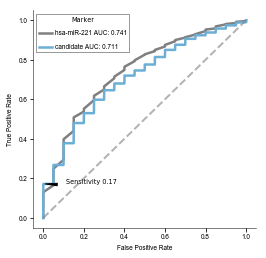

In [27]:
markers_auc = {}
candidatevalue={}

for i in range(1):
    compare_group = 'Normal-CRC' 
    preprocess_method = tmpdict['Normal-CRC']
#for compare_group, preprocess_method in tqdm(tmpdict.items()):
    preprocess_method = preprocess_method[np.where(np.array([preprocess_method[i].split('.')[-1] for i in range(preprocess_method.shape[0])])==exp_mx_name)][0]
    
    shuffle_split_roc_file = 'output/'+dataset+'/cross_validation/'+preprocess_method+'/'+compare_group+'/'+classifier_use+'.10.robust.'+value_change+'/cross_validation.h5'
    fig,ax=plt.subplots(1,figsize=(4,4))
    #markername  = np.array([control_markers[compare_group][i][0] for i in control_markers[compare_group].keys()])
    markername  = {}
    count = 0
    if compare_group[:10] =='Normal-CRC':
        control_markers[compare_group] = control_markers['Normal-CRC']
    for i in control_markers[compare_group].keys():
        tmpmarkers = np.unique(np.array([control_markers[compare_group][i][j][:-3] for j in range(control_markers[compare_group][i].shape[0])]))
        if tmpmarkers.shape[0] >1:
            print (tmpmarkers)
            markername[i] = 'Panel '+str(count+1)
            count+=1
        else:
            markername[i] = tmpmarkers[0]
    #print (markername)
    ## TO DO: panel
    if compare_group=='Normal-CRC':
        markers_auc[compare_group],candidatevalue[compare_group] =  plot_shuffle(ax,shuffle_split_roc_file,
                     spe_criter=0.99,compare_group=compare_group,
                    markers_file=return_marker_file(dataset,compare_group,len(control_markers[compare_group].keys()),classifier_use,preprocess_method,de=False)
                #markers_file=return_marker_file(dataset,compare_group,1,de=False)                        
                           ,title= None,marker_roc_ind =marker_roc_ind[compare_group],markername=markername)
    else:
        #dataset,compare_group,num,classifier_use,preprocess_method,
        markers_auc[compare_group],candidatevalue[compare_group] = plot_shuffle(ax,shuffle_split_roc_file,
                     spe_criter=0.99,compare_group=compare_group,
                   markers_file=return_marker_file(dataset,compare_group,len(control_markers[compare_group].keys()),classifier_use,preprocess_method,de=False)
                #markers_file=return_marker_file(dataset,compare_group,0,de=False)  
                         ,title= None,marker_roc_ind =marker_roc_ind[compare_group],markername=markername)
        

HBox(children=(IntProgress(value=0, max=7), HTML(value='')))

Normal-CRC ['filter.null.Norm_CPM_top.Batch_RUV.transcript'
 'filter.null.Norm_CPM_top.Batch_RUV.transcript_small'
 'filter.null.Norm_SCnorm.Batch_Combat_2.transcript_long_bg'
 'filter.viper_count.Norm_SCnorm.Batch_RUV.transcript_long'
 'filter.viper_count.Norm_TMM.Batch_RUV.domains_combined'
 'filter.viper_count.Norm_TMM.Batch_RUV.domains_long']
17 Normal-CRC
Normal-CRC_S1 ['filter.null.Norm_CPM_top.Batch_RUV.transcript'
 'filter.null.Norm_CPM_top.Batch_RUV.transcript_small'
 'filter.null.Norm_SCnorm.Batch_Combat_2.transcript_long_bg'
 'filter.viper_count.Norm_SCnorm.Batch_RUV.transcript_long'
 'filter.viper_count.Norm_TMM.Batch_RUV.domains_combined'
 'filter.viper_count.Norm_TMM.Batch_RUV.domains_long']


KeyError: 'Normal-CRC_S1'

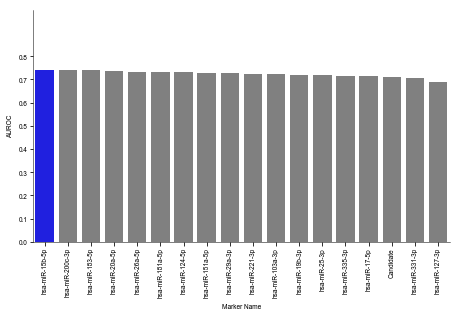

In [29]:
### pd.set_option('display.max_colwidth', -1)
for compare_group, preprocess_method in tqdm(tmpdict.items()):
    print (compare_group, preprocess_method)
    if len(control_markers[compare_group].keys())>0:
        print (len(control_markers[compare_group].keys()),compare_group)
        #markernames  = np.concatenate((np.array(['Candidate']),np.array([control_markers[compare_group][i][0] for i in range(len(control_markers[compare_group].keys()))])))
        markernames = np.ndarray([len(control_markers[compare_group].keys())+1]).astype('str')
        markernames[0] = 'Candidate'
        count = 0
        count_=1
        panel_marker = []
        for i in control_markers[compare_group].keys(): 
            tmpmarkers = np.unique(np.array([control_markers[compare_group][i][j][:-3] for j in range(control_markers[compare_group][i].shape[0])]))
            if tmpmarkers.shape[0] >1:

                markernames[count_] = 'Panel '+str(count)
                panel_marker.append(np.array2string(control_markers[compare_group][i],separator=',')[2:-2].replace("'", ""))
                count+=1
            else:
                markernames[count_] = control_markers[compare_group][i][0]
            count_+=1
        #print (markernames)
        if len(panel_marker) >0:
            panel_table = pd.DataFrame(panel_marker)
            panel_table.index = np.array(['panel '+str(i) for i in range(panel_table.shape[0])])
            panel_table.columns = ['markers']
            display(panel_table)
        selectedind = np.array([i for i in control_markers[compare_group].keys()])
        #print (selectedind)
        
        aucall = np.concatenate((np.array([candidatevalue[compare_group]]),np.array([markers_auc[compare_group][i] for i in markers_auc[compare_group].keys()])))
        auctable =pd.DataFrame(np.concatenate((markernames.reshape(-1,1),aucall.reshape(-1,1)),axis=1))
        auctable.columns = ['Marker Name','AUROC']
        auctable.AUROC = pd.to_numeric(auctable.AUROC )
        auctable = auctable.sort_values('AUROC',ascending=0)
        #display(auctable)
        fig, ax = plt.subplots(1,figsize=(7,4))
        #auctable.plot(kind='bar')
        
        clrs = ['grey' if (x < max(np.array(auctable.AUROC))) else 'blue' for x in np.array(auctable.AUROC)]
        sns.barplot(data=auctable,x='Marker Name',y='AUROC',palette=clrs)
        fig.tight_layout()
        ax.set_xticklabels(auctable.iloc[:,0],rotation=90,fontsize=20,weight='bold')
        ax = std_plot(ax,'Marker Name','AUROC',None)
        ax.set_ylim(0,1)
        #if savefig:
        fig.savefig(savepath+compare_group+'_marker_barplot.eps', bbox_inches='tight')

## TCGA

In [405]:
tcga_dataset = 'tcga_crc'
tcga_cpm = pd.read_table('output/'+tcga_dataset+
                         '/matrix_processing/filter.null.Norm_CPM.Batch_null.transcript.txt',index_col=0)
#tcga_cpm = pd.read_table('output/'+tcga_dataset+
#                        '/count_matrix/transcript.txt',index_col=0)

selectedfeature = selected_features['Normal-CRC']
selectedfeature[np.isin(np.char.lower(np.array(selectedfeature).astype('str')),
                        np.char.lower(np.array(tcga_cpm.index).astype('str')))]

sample_class_tcga = pd.read_table('data/'+tcga_dataset+'/sample_classes.txt',index_col=0)
selectedfeature_overlap = selectedfeature[np.isin(np.char.lower(np.array(selectedfeature).astype('str')),
                        np.char.lower(np.array(tcga_cpm.index).astype('str')))]
testtable = tcga_cpm.loc[selectedfeature_overlap]

appended_table = []
for i in range(testtable.shape[0]):
    appended_table.append(pd.DataFrame(np.concatenate((np.array(sample_class_tcga.loc[testtable.columns]).reshape(-1,1),
                            np.array(testtable.iloc[i].T).reshape(-1,1),
              np.repeat(testtable.index[i].split('|')[2],testtable.shape[1]).reshape(-1,1)),axis=1)))
appended_table=  pd.concat(appended_table, axis=0)
appended_table.columns = ['class','value','gene']
appended_table.value = np.log2(pd.to_numeric(appended_table.value)+0.01)
appended_table['class'][appended_table['class']!='Normal'] ='Cancer'

sys.path.append('bin')
from statannot import *#add_stat_annotation
import statannot 


fig,ax=plt.subplots(1,figsize=(7,4))

x = 'gene'
y = 'value'
hue = 'class'
sns.boxplot(ax=ax,data=appended_table, x=x, y=y, hue=hue)
add_stat_annotation(ax=ax, data=appended_table, x=x, y=y, hue=hue,
                    boxPairList=np.array([((selectedfeature_overlap[i].split('|')[2],'Normal'),
           (selectedfeature_overlap[i].split('|')[2],'Cancer')) 
          for i in range(selectedfeature_overlap.shape[0])]),
                    test='Mann-Whitney',  loc='inside', verbose=2,#textFormat='full'
                   )
ax.legend(loc='upper left', bbox_to_anchor=(1.03, 1))
ax = std_plot(ax,'Gene','Expression Value',None)
fig.tight_layout()
embed_pdf_figure()


pvalue annotation legend:
ns: 5.00e-02 < p <= 1.00e+09
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

hsa-miR-935_Normal v.s. hsa-miR-935_Cancer: MWW RankSum two-sided P_val=8.506e-05 U_stat=1.134e+03
hsa_piR_019420_Normal v.s. hsa_piR_019420_Cancer: MWW RankSum two-sided P_val=7.305e-01 U_stat=7.020e+02
hsa-miR-125a-5p_Normal v.s. hsa-miR-125a-5p_Cancer: MWW RankSum two-sided P_val=4.423e-08 U_stat=1.320e+03


## Cluster map

In [117]:
cpm_table_use['genetype'] = np.array([feature_matrix.index[i].split('|')[1] for i in range(feature_matrix.shape[0])])
pd.concat((sample_class_use.T,cpm_table_use)).to_csv('tmp.txt',sep='\t')
from clustergrammer_widget import Network, clustergrammer_widget
net = Network(clustergrammer_widget)
net.load_file('tmp.txt')

# cluster using default parameters
net.cluster(enrichrgram=True)

# make interactive widget
net.widget()

In [ ]:
def open_file_or_stdout(filename):
    if filename == '-':
        return sys.stdout
    else:
        return open(filename, 'w')
def extract_feature_sequence(output_file,genome_dir,selected_features):
    from pyfaidx import Fasta
    from Bio.Seq import Seq

    fout = open_file_or_stdout(output_file)
    fastas = {}
    for feature in selected_features:
        gene_id, gene_type, gene_name, domain_id, transcript_id, start, end = feature.split('|')
        if gene_type=='miRNA':
            gene_type = 'mature_miRNA'
        start = int(start)
        end = int(end)
        if gene_type == 'genomic':
            gene_type = 'genome'
        if gene_type not in fastas:
            fastas[gene_type] = Fasta(os.path.join(genome_dir, 'fasta', gene_type + '.fa'))
        if gene_type == 'genome':
            chrom, gstart, gend, strand = gene_id.split('_')
            gstart = int(gstart)
            gend = int(gend)
            seq = fastas[gene_type][chrom][gstart:gend].seq
            if strand == '-':
                seq = str(Seq(seq).reverse_complement())
        else:
            seq = fastas[gene_type][transcript_id][start:end].seq
        seq = seq.upper()
        fout.write('>{}\n'.format(feature))
        fout.write(seq)
        fout.write('\n')
    fout.close()

In [ ]:
for compare_group, preprocess_method in tqdm(best_preprocess_methods.items()):
    extract_feature_sequence(savepath+compare_group+'_sequence.txt','/Share/home/shibinbin/projects/exSeek-dev/genome/hg38/',
                         selected_features[compare_group])

In [ ]:
for compare_group, preprocess_method in tqdm(best_preprocess_methods.items()):
    print ('output/'+dataset+'/matrix_processing/'+preprocess_method+'.txt')

In [ ]:
genename_remain = {}
best_processed_mx = {}

for compare_group, preprocess_method in tqdm(best_preprocess_methods.items()):
    best_processed_mx[compare_group] =pd.read_table('output/'+dataset+'/matrix_processing/'+preprocess_method+'.txt')
    genename_remain[compare_group] = np.array([best_processed_mx[compare_group].index[i].split('|')[0] for i
                            in range(best_processed_mx[compare_group].index.shape[0])])
    

In [ ]:
for compare_group, preprocess_method in tqdm(best_preprocess_methods.items()):
    for i in range(len(control_markers[compare_group].keys())):
        tmptab = best_processed_mx[compare_group].iloc[np.isin(genename_remain[compare_group],control_markers[compare_group][i])]
        tmptab.to_csv('control_markers/'+dataset+'/data/'+compare_group+'/control_markers_'+str(i)+'.txt',sep='\t')


#CRC
miR-92-3p,miR-21,miR-139-3p,miR-431
miR-20a
miR-26a
miR-124-5p
miR-141
miR-183
miR-221
miR-200c
miR-25-3p
miR-331-3p
miR-103a-3p
miR-127-3p
miR-151a-5p
miR-17-5p
miR-181a-5p
miR-18a-5p
miR-18b-5p
miR18a
miR19a
miR19b
miR15b
miR29a
miR335
miR-92
miR-17-3p

#Pancreat
miR-106b
miR-10b
miR-21
miR-30c
miR-20a
miR-181a
miR-483
miR-let7a
miR-122
miR-22
miR-642
miR-885
miR-223
miR-744
miR-10b
miR-30c
miR-106b
hsa-miR-155-5p
miR-212
Panel(miR-10b, miR-106b)
miR-182
miR-16
miR-885
miR-22
miR-642
Panel (miR-885, miR-22, miR-642)
miR-221
Panel (miR-16, miR-196a)
miR-21
miR-210
miR-155
miR-196a
Panel (miR-21,miR-210, miR-155, miR-196a)

#prostate
miR-30c
miR-26b
miR-451
miR-223
miR-24
miR-874
miR-1274a
miR-1207-5p
miR-93
miR-106a
panel(let-7e,let-7c,miR-30c,miR-622 and miR-1285)
miR-21
miR-221
miRNA-375
miRNA-141
miR-1290
miR-375
miR-107
miR-130B
miR-141
miR-181a-2
miR-2110
miR-301A
miR-326
miR-331-3p
miR-432
miR-484
miR-574-3p
miR-625

In [ ]:
original_mx_name=  np.array([original_mx.index[i].split('|')[2] for i in  range(original_mx.index.shape[0]) ])
markername  = np.array([control_markers['Normal-CRC'][i][0] for i in range(len(control_markers['Normal-CRC'].keys()))])
marker_mx = original_mx.iloc[np.isin(original_mx_name,markername)]
sampleindex = marker_mx.columns

featureindex = np.array([marker_mx.index[i].split('|')[2]  for i in range(marker_mx.index.shape[0])])
testtable = pd.DataFrame(np.concatenate((np.array(marker_mx).reshape(-1,1),
        np.repeat(np.array(sample_class.index),featureindex.shape[0]).reshape(-1,featureindex.shape[0]).T.reshape(-1,1),
   np.repeat(np.array(sample_class.label),featureindex.shape[0]).reshape(-1,featureindex.shape[0]).T.reshape(-1,1),
        np.repeat(np.array(featureindex),sampleindex.shape[0]).reshape(-1,1)),axis=1))
testtable.columns=['Expression value','Sample','Class','Feature']
testtable['Class'].iloc[np.where(testtable.Class !='Healthy Control')] ='Cancer'
testtable.iloc[:,0] = np.log2(np.array(testtable.iloc[:,0]).astype('float'))
x = 'Feature'
y = 'Expression value'
hue = 'Class'
        
fig, ax = plt.subplots(figsize=(25,8))
sns.boxplot(data = testtable,ax=ax,x=x,y=y,hue=hue)
#sns.stripplot(data =testtable,ax=ax,x=x,y=y,hue=hue,size=3, edgecolor='black')
ax.set_xticklabels(markername,rotation=20,fontsize=20)
#ax.set_yticklabels(['{:.1f}%'.format((i-1)*20) for i in range(10)],fontsize=20,fontweight='bold')

add_stat_annotation(ax=ax, data=testtable, x=x, y=y, hue=hue,
                    boxPairList=np.array([((markername[i],'Healthy Control'),(markername[i],'Cancer')) for i in range(markername.shape[0])]),
                    test='Mann-Whitney',  loc='inside', verbose=2,#textFormat='full'
                   )
ax.legend(loc='upper left', bbox_to_anchor=(1.03, 1))
ax = std_plot(ax,'Markers','Log Expression Value',title=None)
fig.tight_layout()

In [291]:
def extract_featurefile(best_preprocess_methods):
    filename = []
    for compare_group, preprocess_method in tqdm(best_preprocess_methods.items()):
        tmp='output/'+dataset+'/cross_validation/'+preprocess_method+'/'+compare_group+'/random_forest.10.robust/features.txt'
        filename.append(tmp)
    return np.array(filename)
np.savetxt('output/selected_feature/'+dataset+'/selected_features.txt',
           extract_featurefile(best_preprocess_methods),fmt='%s')

HBox(children=(IntProgress(value=0, max=105), HTML(value='')))

TypeError: must be str, not tuple

HBox(children=(IntProgress(value=0, max=3), HTML(value='')))

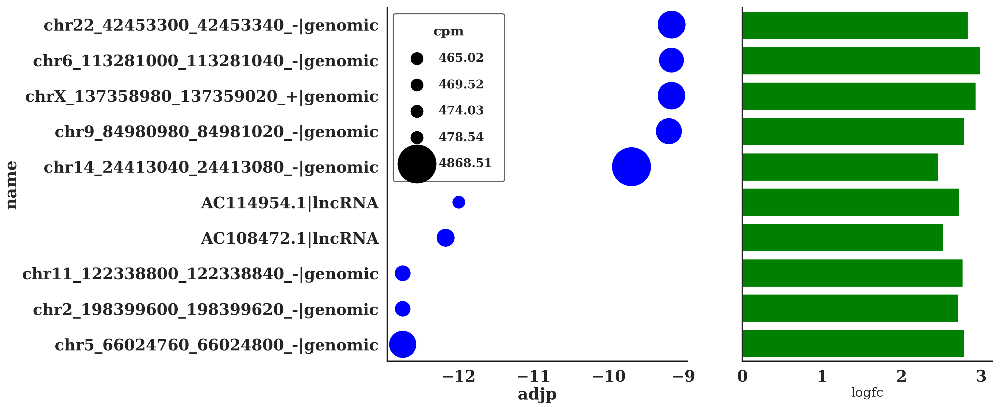

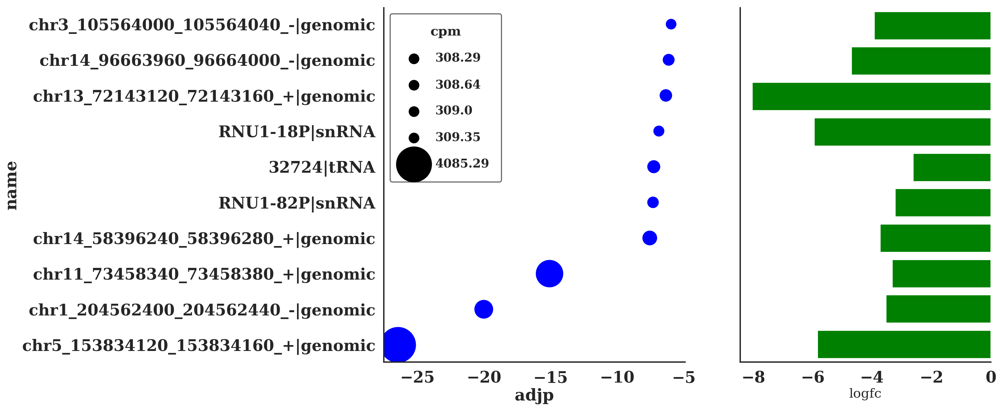

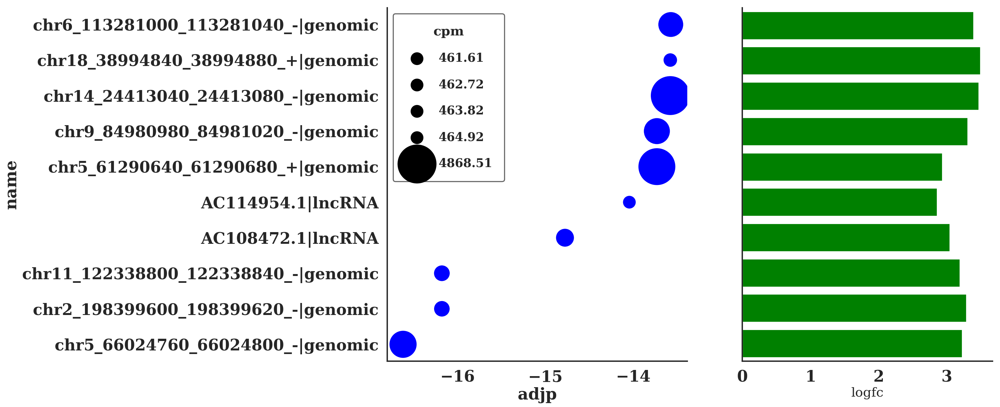

In [509]:
def DE_bar_plot(detable,rpkmtable,nums_retain=10):
    remain_table = detable.sort_values('padj').iloc[:nums_retain]
    featurename = remain_table.index
    featurename = np.array([featurename[i].split('|')[2]+'|'+featurename[i].split('|')[1] for i in range(len(featurename))])
    padj = remain_table.padj
    logfc = remain_table.log2FoldChange
    rpkm = rpkmtable.loc[remain_table.index].mean(axis=1)
    dataframe= pd.DataFrame(np.concatenate((featurename.reshape(-1,1),padj.reshape(-1,1),
                                           logfc.reshape(-1,1),rpkm.reshape(-1,1)),axis=1),columns=['name','padj','logfc','rpkm'])

    #dataframe_rpkm= pd.DataFrame(np.concatenate((featurename.reshape(-1,1),rpkm.reshape(-1,1)),axis=1),columns=['name','rpkm'])
    dataframe.padj  =  np.log10(dataframe.padj.astype('float'))
    dataframe.logfc  =  pd.to_numeric(dataframe.logfc)
    dataframe.rpkm  =  pd.to_numeric(dataframe.rpkm)

    fig,ax=plt.subplots(1,3,figsize=(nums_retain*4,12))
    sns.barplot(ax=ax[0],data=dataframe,y='name',x='padj',color='r',saturation=1)
    ax[0].set_xlabel('log10 adjusted p value')
    sns.barplot(ax=ax[1],data=dataframe,y='name',x='logfc',color='b',saturation=1)
    sns.barplot(ax=ax[2],data=dataframe,y='name',x='rpkm',color='g',saturation=1)
    #sns.barplot(ax=ax[2],data=dataframe_rpkm.iloc[:nums_retain],y='name',x='rpkm',color='g',saturation=1)
    if sequencing_type =='short':
        ax[2].set_xlabel('cpm')
    elif sequencing_type =='long':
        ax[2].set_xlabel('rpkm')
    plt.figure(linewidth=30.5)
    for i in range(3):
        ax[i].spines['right'].set_visible(False)
        ax[i].spines['top'].set_visible(False)
    fig.tight_layout()
    if savefig:
        fig.savefig(savepath+compare_group+'_bar_plot.png', bbox_inches='tight')
    ax[1].get_yaxis().set_ticks([])
    ax[1].set_ylabel('')
    ax[2].get_yaxis().set_ticks([])
    ax[2].set_ylabel('')
    fig.tight_layout()
    
def DE_bar_plot_(detable,rpkmtable,nums_retain=10):
    remain_table = detable.sort_values('padj').iloc[:nums_retain]
    featurename = remain_table.index
    featurename = np.array([featurename[i].split('|')[2]+'|'+featurename[i].split('|')[1] for i in range(len(featurename))])
    padj = remain_table.padj
    logfc = remain_table.log2FoldChange
    rpkm = rpkmtable.loc[remain_table.index].mean(axis=1)
    dataframe= pd.DataFrame(np.concatenate((featurename.reshape(-1,1),padj.reshape(-1,1),
                                           logfc.reshape(-1,1),rpkm.reshape(-1,1)),axis=1),columns=['name','padj','logfc','rpkm'])

    #dataframe_rpkm= pd.DataFrame(np.concatenate((featurename.reshape(-1,1),rpkm.reshape(-1,1)),axis=1),columns=['name','rpkm'])
    dataframe.padj  =  np.log10(dataframe.padj.astype('float'))
    dataframe.logfc  =  pd.to_numeric(dataframe.logfc)
    dataframe.rpkm  =  pd.to_numeric(dataframe.rpkm)

    fig,ax=plt.subplots(1,2,figsize=(nums_retain*4,12))
    #sns.barplot(ax=ax[0],data=dataframe,y='name',x='padj',color='r',saturation=1)
    #for i in range(nums_retain):
        #display(pd.DataFrame(dataframe.iloc[i]).T)
    sns.stripplot(ax=ax[0],y='name',x='padj', data = dataframe, 
               palette="Set1", size=np.arange(100,200,10))#dataframe.rpkm[i])
    ax[0].set_xlabel('log10 adjusted p value')
    #sns.barplot(ax=ax[1],data=dataframe,y='name',x='logfc',color='b',saturation=1)
    sns.barplot(ax=ax[1],data=dataframe,y='name',x='logfc',color='g',saturation=1)
    #sns.barplot(ax=ax[2],data=dataframe_rpkm.iloc[:nums_retain],y='name',x='rpkm',color='g',saturation=1)
    
    if sequencing_type =='short':
        mattype = 'cpm'
    elif sequencing_type =='long':
        mattype = 'rpkm'
    ax[1].set_xlabel(mattype)
    plt.figure(linewidth=30.5)
    for i in range(2):
        ax[i].spines['right'].set_visible(False)
        ax[i].spines['top'].set_visible(False)
    fig.tight_layout()
    if savefig:
        fig.savefig(savepath+compare_group+'_bar_plot.png', bbox_inches='tight')
    ax[1].get_yaxis().set_ticks([])
    ax[1].set_ylabel('')
    #ax[2].get_yaxis().set_ticks([])
    #ax[2].set_ylabel('')
    fig.tight_layout()
def DE_bar_plot__(detable,rpkmtable,nums_retain=10):
    remain_table = detable.sort_values('padj').iloc[:nums_retain]
    featurename = remain_table.index
    featurename = np.array([featurename[i].split('|')[2]+'|'+featurename[i].split('|')[1] for i in range(len(featurename))])
    padj = remain_table.padj
    logfc = remain_table.log2FoldChange
    rpkm = rpkmtable.loc[remain_table.index].mean(axis=1)
    dataframe= pd.DataFrame(np.concatenate((featurename.reshape(-1,1),padj.reshape(-1,1),
                                           logfc.reshape(-1,1),rpkm.reshape(-1,1)),axis=1),columns=['name','padj','logfc','rpkm'])

    #dataframe_rpkm= pd.DataFrame(np.concatenate((featurename.reshape(-1,1),rpkm.reshape(-1,1)),axis=1),columns=['name','rpkm'])
    dataframe.padj  =  np.log10(dataframe.padj.astype('float'))
    dataframe.logfc  =  pd.to_numeric(dataframe.logfc)
    dataframe.rpkm  =  pd.to_numeric(dataframe.rpkm)    
    #display(dataframe)
    f, (ax, ax1) = plt.subplots(1,2, figsize=(nums_retain*2,12),gridspec_kw = {'width_ratios':[1.2, 1]})
    scalefactor=1
    ax.scatter(dataframe.padj, np.arange(10),
                c = 'b', s=(dataframe.rpkm)*5, cmap="viridis")
    ax.set_xlabel("adjp",fontsize=30,fontdict=dict(weight='bold'))
    ax.set_ylabel("name",fontsize=30,fontdict=dict(weight='bold'))
    ax.set_yticks(np.arange(10))
    ax.set_yticklabels(featurename)
    if sequencing_type =='short':
        mattype = 'cpm'
    elif sequencing_type =='long':
        mattype = 'rpkm'
    #make a legend:
    pws = np.round(np.array([np.min(dataframe.rpkm),np.percentile(dataframe.rpkm,0.2),
                   np.percentile(dataframe.rpkm,0.4),np.percentile(dataframe.rpkm,0.6),
                   np.percentile(dataframe.rpkm,0.8),np.max(dataframe.rpkm)])*5,2)
    for pw in pws:
        ax.scatter([], [], s=pw*scalefactor, c="k",label=str(pw))
        
    h,l = ax.get_legend_handles_labels()
    ax.legend(h[1:], l[1:], labelspacing=1.2, title=mattype, borderpad=1, 
                frameon=True, framealpha=0.6, edgecolor="k", facecolor="w")
    sns.barplot(ax=ax1,data=dataframe,y='name',x='logfc',color='g',saturation=1)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax1.spines['right'].set_visible(False)
    ax1.spines['top'].set_visible(False)
    fig.tight_layout()
    if savefig:
        fig.savefig(savepath+compare_group+'_bar_plot.png', bbox_inches='tight')
    ax1.get_yaxis().set_ticks([])
    ax1.set_ylabel('')
    
for compare_group, preprocess_method in tqdm(best_preprocess_methods.items()):
    if sequencing_type =='short':
        tmptable = cpm_table_origin
    elif sequencing_type =='long':
        tmptable = rpkm_table_origin
    detable = pd.read_table('output/'+dataset+'/differential_expression/'+exp_mx_name+'/'+compare_group+'/deseq2.txt'
                       ,index_col=0)
    DE_bar_plot__(detable,tmptable,nums_retain=10)